#Laboratory 4 - 10 points (deadline 12/2/2023)
Dataset: Celeba https://www.kaggle.com/datasets/jessicali9530/celeba-dataset

Dataset preparation: use a detector/segmentator to pre-cut out people’s faces.

You can also add a face alignment technique (optional).

Train VAE or GAN for unconditional face generation task.

And then convert the same grid into a conditional one and train it for the task of conditionally generating faces based on a person’s gender (or any other characteristic).

Metrics: calculate FID and IS, show learning curves.

! Google and read for yourself what techniques and improvements should be added to VAE/GAN so that they learn better! For example, instead of a simple GAN, it is better to look towards WGAN (Wasserstein GAN)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#Installations

In [ ]:
!pip install mtcnn
!pip install pytorch_pretrained_biggan pytorch_fid

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 26.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.3/139.3 kB 5.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 26.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.0/82.0 kB 9.7 MB/s eta 0:00:00


#importings

In [ ]:
import numpy as np
import pandas as pd
from torch import nn
import os
import pandas as pd
from matplotlib import pyplot as plt
from tqdm import tqdm
from PIL import Image as Img
from torchvision.datasets import ImageFolder
from torchvision.transforms import v2
from torch.utils.data import DataLoader
import torch


#Dataset Preparation

#Loading

In [ ]:
# https://www.kaggle.com/discussions/general/74235
! mkdir ~/.kaggle
! cp /content/drive/MyDrive/kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d jessicali9530/celeba-dataset

100% 1.33G/1.33G [01:08<00:00, 23.5MB/s]
100% 1.33G/1.33G [01:08<00:00, 20.8MB/s]


In [ ]:
!mkdir 'celeba-dataset'

In [ ]:
!unzip '/content/celeba-dataset.zip' -d 'celeba-dataset'

Streaming output truncated to the last 5000 lines.
  inflating: celeba-dataset/img_align_celeba/img_align_celeba/197604.jpg  
  inflating: celeba-dataset/img_align_celeba/img_align_celeba/197605.jpg  
  inflating: celeba-dataset/img_align_celeba/img_align_celeba/197606.jpg  
  inflating: celeba-dataset/img_align_celeba/img_align_celeba/197607.jpg  
  inflating: celeba-dataset/img_align_celeba/img_align_celeba/197608.jpg  
  inflating: celeba-dataset/img_align_celeba/img_align_celeba/197609.jpg  
  inflating: celeba-dataset/img_align_celeba/img_align_celeba/197610.jpg  
  inflating: celeba-dataset/img_align_celeba/img_align_celeba/197611.jpg  
  inflating: celeba-dataset/img_align_celeba/img_align_celeba/197612.jpg  
  inflating: celeba-dataset/img_align_celeba/img_align_celeba/197613.jpg  
  inflating: celeba-dataset/img_align_celeba/img_align_celeba/197614.jpg  
  inflating: celeba-dataset/img_align_celeba/img_align_celeba/197615.jpg  
  inflating: celeba-dataset/img_align_celeba/img_

#Reading and saving pre-cut faces

In [ ]:
!rm -r '/content/celeba-dataset/img_align_celeba/pre-cut faces'

rm: cannot remove '/content/celeba-dataset/img_align_celeba/pre-cut faces': No such file or directory


In [ ]:
#pre-cut faces
import cv2
from mtcnn import MTCNN
import os

# Set the path to the directory containing images
image_dir = "/content/celeba-dataset/img_align_celeba/img_align_celeba"

# Set the output directory for saving pre-cut faces
output_dir = "/content/celeba-dataset/img_align_celeba/pre-cut faces"
os.makedirs(output_dir, exist_ok=True)

# Initialize the MTCNN detector
detector = MTCNN()
j = 50
# Process each image in the specified directory
for filename in os.listdir(image_dir):
    if filename.endswith(".jpg") or filename.endswith(".png"):
        # Load the image
        image_path = os.path.join(image_dir, filename)
        image = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Detect faces using MTCNN
        faces = detector.detect_faces(image_rgb)

        # Extract and save pre-cut faces
        for i, face_info in enumerate(faces):
            x, y, w, h = face_info['box']
            face = image[y:y+h, x:x+w]

            # Save pre-cut face
            face_filename = f"{os.path.splitext(filename)[0]}_face_{i+1}.jpg"
            face_path = os.path.join(output_dir, face_filename)
            cv2.imwrite(face_path, face)
        j = j - 1
    if j < 0:
      break
print("Pre-cut faces saved successfully.")


1/1 [==============================] - 0s 34ms/step
Pre-cut faces saved successfully.


In [ ]:
len(os.listdir('/content/celeba-dataset/img_align_celeba/pre-cut faces'))

51

In [ ]:
#
PIC_DIR = f'/content/celeba-dataset/img_align_celeba/pre-cut faces/'
# PIC_DIR = f'/content/celeba-dataset/img_align_celeba/img_align_celeba/'

IMAGES_COUNT = 3585

ORIG_WIDTH = 178
ORIG_HEIGHT = 208
diff = (ORIG_HEIGHT - ORIG_WIDTH) // 2

WIDTH = 64
HEIGHT = 64

crop_rect = (0, diff, ORIG_WIDTH, ORIG_HEIGHT - diff)

images = []
for pic_file in tqdm(os.listdir(PIC_DIR)[:IMAGES_COUNT]):
    pic = Img.open(PIC_DIR + pic_file).resize((64,64)).convert('RGB')
    pic.thumbnail((WIDTH, HEIGHT), Img.ANTIALIAS)
    images.append(np.uint8(pic))
images = np.asarray(images)
print(images.shape)

  0%|          | 0/51 [00:00<?, ?it/s]<ipython-input-11-032e70b00ca8>:19: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  pic.thumbnail((WIDTH, HEIGHT), Img.ANTIALIAS)
100%|██████████| 51/51 [00:00<00:00, 538.50it/s]

(51, 64, 64, 3)


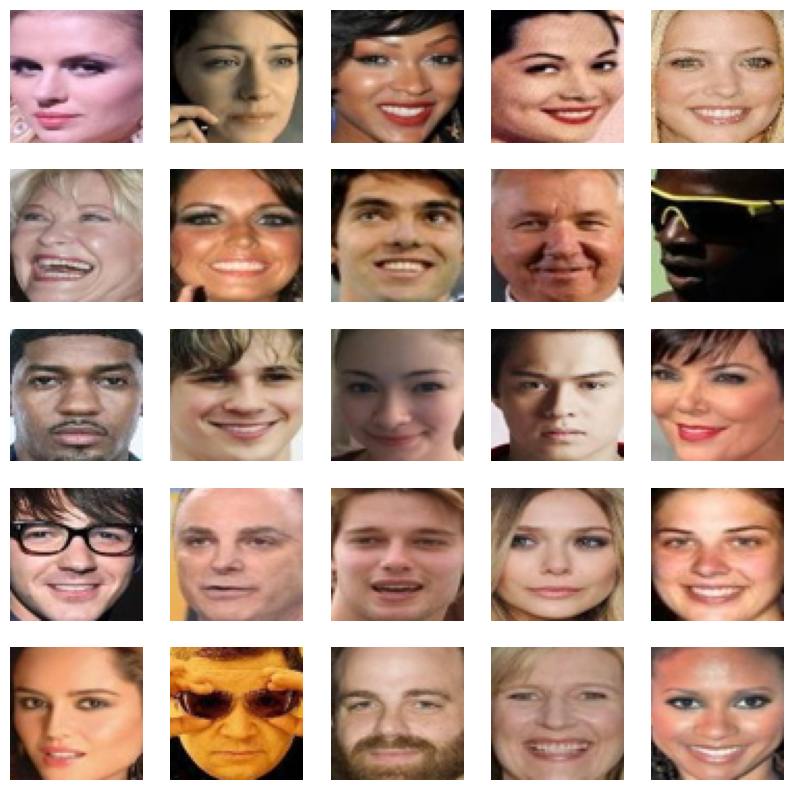

In [ ]:
#Display first 25 images
plt.figure(1, figsize=(10, 10))
for i in range(25):
    plt.subplot(5, 5, i+1)
    plt.imshow(images[i])
    plt.axis('off')
plt.show()

#Dataset & Dataloader for unconditional

In [ ]:
my_list = os.listdir('/content/celeba-dataset/img_align_celeba/img_align_celeba/')
with open('/content/celeba-dataset/img_align_celeba/img_align_celeba/.txt', 'w') as file:
    for item in my_list:
        file.write(f'{item}\n')

In [ ]:
from torchvision.datasets import ImageFolder
from torchvision.transforms import v2
from torch.utils.data import DataLoader
import torch

batch_size = 128

train_dataset = ImageFolder(root='/content/celeba-dataset',
                            transform=v2.Compose([v2.Resize(64),
                                                  v2.CenterCrop(64),
                                                  v2.ToImage(),
                                                  v2.ToDtype(torch.float32, scale=True),
                                                  v2.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))]))

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2, pin_memory=True)

#Building unconditional GAN

In [ ]:
import tensorflow as tf
from keras import layers, Sequential
def create_generator():
  return nn.Sequential(
        # скрытое пространство размера 128
        nn.ConvTranspose2d(128, 512, kernel_size=4, stride=1, padding=0, bias=False),
        nn.BatchNorm2d(512),
        nn.ReLU(True),

        nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(256),
        nn.ReLU(True),

        nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(128),
        nn.ReLU(True),

        nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(64),
        nn.ReLU(True),

        nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
        nn.Tanh()
    )

In [ ]:
def create_discriminator():
    return nn.Sequential(
        nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(64),
        nn.LeakyReLU(0.2, inplace=True),

        nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(128),
        nn.LeakyReLU(0.2, inplace=True),

        nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(256),
        nn.LeakyReLU(0.2, inplace=True),

        nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(512),
        nn.LeakyReLU(0.2, inplace=True),

        nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),

        nn.Flatten(),
        nn.Sigmoid()
    )

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

#IS and FID

In [ ]:
import torch
from torchvision.models import inception_v3
from torchvision.transforms import functional as F
from scipy.linalg import sqrtm
from tqdm import tqdm

def torch_cov(m, rowvar=False):
    """Estimate a covariance matrix given data."""
    if m.dim() > 2:
        raise ValueError("m has more than 2 dimensions")
    if m.dim() < 2:
        m = m.view(1, -1)
    if not rowvar and m.size(0) != 1:
        m = m.t()
    fact = 1.0 / (m.size(0) - 1)
    m -= torch.mean(m, dim=0, keepdim=True)
    mt = m.t()  # if complex: mt = m.t().conj()
    return fact * m.matmul(mt).squeeze()

def calculate_frechet_distance(mu1, sigma1, mu2, sigma2):
    """Calculate Frechet distance between two multivariate Gaussians."""
    eps = 1e-6
    sqrt_term = torch.norm(sigma1 @ sigma2, p='fro')
    mu_diff = mu1 - mu2
    cov_term = torch.trace(sigma1 + sigma2 - 2 * sqrtm(sigma1 @ sigma2 + eps))

    return mu_diff.norm() + cov_term + sqrt_term
model_inception_v3 = inception_v3(pretrained=True, aux_logits=True).to(device).eval()
def calculate_fid_from_scratch(real_loader, generated_samples, device='cuda', batch_size=64, dims=64):
    # model = inception_v3(pretrained=True, aux_logits=True).to(device).eval()

    # Get InceptionV3 features for real samples
    real_preds = []

    for real_images, _ in tqdm(real_loader):
        real_images = real_images.to(device)
        real_images_resized = F.resize(real_images, (128, 128))
        real_preds.append(model_inception_v3(real_images_resized).detach())

    real_preds = torch.cat(real_preds, dim=0)
    mu1, sigma1 = real_preds.mean(dim=0).cpu(), torch_cov(real_preds, rowvar=False).cpu()

    # Get InceptionV3 features for generated samples
    generated_preds = []

    for i in tqdm(range(0, len(generated_samples), batch_size)):
        generated_batch = generated_samples[i:i + batch_size].to(device)
        generated_batch_resized = F.resize(generated_batch, (299, 299))
        generated_preds.append(model_inception_v3(generated_batch_resized).detach())

    generated_preds = torch.cat(generated_preds, dim=0)
    mu2, sigma2 = generated_preds.mean(dim=0).cpu(), torch_cov(generated_preds, rowvar=False).cpu()

    # Calculate FID
    fid_value = calculate_frechet_distance(mu1, sigma1, mu2, sigma2)

    return fid_value


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth
100%|██████████| 104M/104M [00:00<00:00, 169MB/s] 


In [ ]:
import torch
from torchvision.models import inception_v3
from torchvision import transforms
from torch.utils.data import DataLoader
inception_model = inception_v3(pretrained=True, transform_input=False).to(device)
def calculate_inception_score(generator, num_classes, num_samples, device, batch_size=64, num_splits=10):
    # Set the generator to evaluation mode
    generator.eval()

    # # Generate fake images
    # # fake_images, _ = generate_fake_images(generator, num_classes, num_images, device)
    # fake_images = generate_samples(generator, num_samples, 64, num_classes)

    noise = torch.randn(batch_size, 128, 1, 1, device=device)
    fake_images = generator(noise)
    # Resize and normalize images for Inception model
    transform = transforms.Compose([
        transforms.Resize((299, 299)),
        # transforms.ToTensor(),
        transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
    ])
    fake_images = torch.stack([transform(image) for image in fake_images])

    # Create a DataLoader for the generated images
    fake_dataset = torch.utils.data.TensorDataset(fake_images)
    fake_dataloader = DataLoader(fake_dataset, batch_size=batch_size, shuffle=False)

    # Load the Inception model
    # inception_model = inception_v3(pretrained=True, transform_input=False).to(device)
    inception_model.eval()

    # Function to calculate the Inception Score
    def inception_score(images, num_splits):
        scores = []
        for i in range(num_splits):
            start_idx = i * (len(images) // num_splits)
            end_idx = (i + 1) * (len(images) // num_splits)

            batch = images[start_idx:end_idx]
            batch_scores = torch.nn.functional.softmax(inception_model(batch), dim=1)
            scores.append(batch_scores)

        scores = torch.cat(scores, dim=0)
        kl_divergence = scores * (torch.log(scores) - torch.log(torch.mean(scores, dim=0)))
        score = torch.exp(torch.mean(torch.sum(kl_divergence, dim=1)))

        return score.item()

    # Calculate Inception Score
    inception_score_value = inception_score(fake_images, num_splits)

    # Set the generator back to training mode
    generator.train()

    return inception_score_value



#Training functions

In [ ]:

def train_d(d, g, real_images, optimizer):


    optimizer.zero_grad()


    real_preds = d(real_images)


    real_targets = torch.ones(real_images.size(0), 1, device=device)

    real_loss = nn.functional.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()

    noise = torch.randn(batch_size, 128, 1, 1, device=device)
    fake_images = g(noise)


    fake_preds = d(fake_images)


    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)


    fake_loss = nn.functional.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    loss = real_loss + fake_loss
    loss.backward()
    optimizer.step()

    return loss.item(), real_score, fake_score


In [ ]:

def train_g(d, g, optimizer):
    optimizer.zero_grad()

    # генерация
    latent = torch.randn(batch_size, 128, 1, 1, device=device)
    fake_images = g(latent)

    # предсказания дискриминатора
    preds = d(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = nn.functional.binary_cross_entropy(preds, targets)

    loss.backward()
    optimizer.step()

    return loss.item()

In [ ]:
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

def plot_fakes(g):
    noise = torch.randn(64, 128, 1, 1, device=device)
    fake_images = g(noise)

    fig, ax = plt.subplots(figsize=(8,8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))
    plt.show()

In [ ]:
!mkdir '/content/drive/MyDrive/saved_models'

mkdir: cannot create directory ‘/content/drive/MyDrive/saved_models’: File exists


In [ ]:
!mkdir '/content/drive/MyDrive/saved_models/cv4'

mkdir: cannot create directory ‘/content/drive/MyDrive/saved_models/cv4’: File exists


In [ ]:
from tqdm import tqdm
import pickle

def train_loop(d, g, d_optimizer, g_optimizer, train_loader, epochs):
    d_losses = []
    g_losses = []
    real_scores = []
    is_values = []
    fid_values = []
    fake_scores = []
    n = len(train_loader)

    for epoch in range(epochs):
        print(f'Epoch {epoch+1}/{epochs}')

        running_d_loss = 0.
        running_g_loss = 0.
        running_real_score = 0.
        running_fake_score = 0.

        for real_images, _ in tqdm(train_loader):
            real_images = real_images.to(device)

            d_loss, real_score, fake_score = train_d(d, g, real_images, d_optimizer)
            g_loss = train_g(d, g, g_optimizer)

            running_d_loss += d_loss
            running_g_loss += g_loss
            running_real_score += real_score
            running_fake_score += fake_score

        running_d_loss /= n
        running_g_loss /= n
        running_real_score /= n
        running_fake_score /= n

        d_losses.append(running_d_loss)
        g_losses.append(running_g_loss)
        real_scores.append(running_real_score)
        fake_scores.append(running_fake_score)

        print('d_loss: {:.4f}'.format(running_d_loss))
        print('g_loss: {:.4f}'.format(running_g_loss))
        print('real_scores: {:.4f}'.format(running_real_score))
        print('fake_scores: {:.4f}'.format(running_fake_score))

        plot_fakes(g)
        latent = torch.randn(batch_size, 128, 1, 1, device=device)
        fake_samples = g(latent)
        torch.save(d.state_dict(), f'/content/drive/MyDrive/saved_models/cv4/d_{epoch+1}.pth')
        torch.save(g.state_dict(), f'/content/drive/MyDrive/saved_models/cv4/g_{epoch+1}.pth')
        fid_value = calculate_fid_from_scratch(train_loader, fake_samples, device=device)
        inseption_score = calculate_inception_score(g, 1, 64, device)
        is_values.append(inseption_score)
        fid_values.append(fid_value)
        save_learning_curves(d_losses = d_losses, g_losses = g_losses,\
                             real_scores= real_scores, fake_scores= fake_scores, \
                             fid_values= fid_values, is_values =is_values)

    history = {'d_losses': d_losses,
               'g_losses': g_losses,
               'real_scores': real_scores,
               'fake_scores': fake_scores,
               'fid_values': fid_values,
               'is_values': is_values}
    save_learning_curves(d_losses, g_losses, real_scores, fake_scores, fid_values, is_values)
    with open('/content/drive/MyDrive/saved_models/cv4/history.pkl', 'wb') as handle:
        pickle.dump(history, handle, protocol=pickle.HIGHEST_PROTOCOL)

    return history

def save_learning_curves(d_losses, g_losses, real_scores, fake_scores, fid_values, is_values):
    # Save learning curves
    plt.figure(figsize=(12, 6))

    plt.subplot(2, 2, 1)
    plt.plot(d_losses, label='Discriminator Loss')
    plt.plot(g_losses, label='Generator Loss')
    plt.title('Generator and Discriminator Losses')
    plt.legend()

    plt.subplot(2, 2, 2)
    plt.plot(real_scores, label='Real Scores')
    plt.plot(fake_scores, label='Fake Scores')
    plt.title('Real and Fake Scores')
    plt.legend()

    plt.subplot(2, 2, 3)
    plt.plot(fid_values, label='FID')
    plt.title('FID over Epochs')

    plt.subplot(2, 2, 4)
    plt.plot(is_values, label='IS')
    plt.title('Inception Score over Epochs')

    plt.tight_layout()
    plt.savefig('/content/drive/MyDrive/saved_models/cv4/learning_curves.png')
    plt.show()
    plt.close()



#Training

Epoch 1/10


100%|██████████| 1583/1583 [06:09<00:00,  4.29it/s]


d_loss: 0.6962
g_loss: 4.3620
real_scores: 0.7805
fake_scores: 0.2189


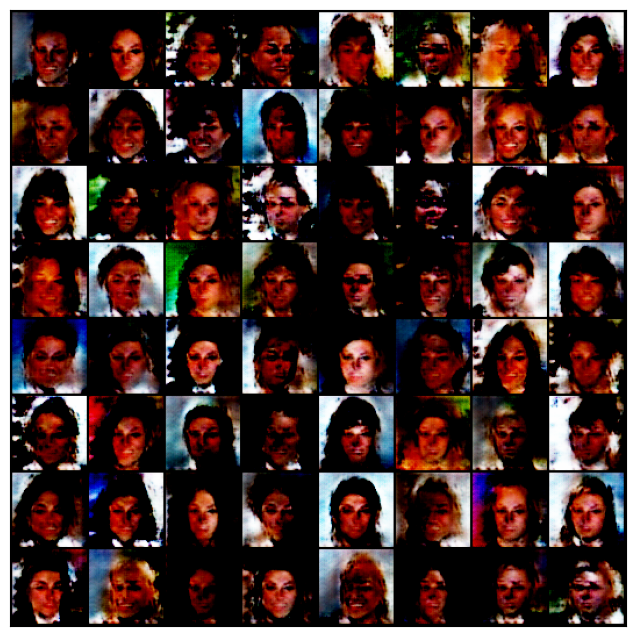

100%|██████████| 2/2 [00:00<00:00, 38.09it/s]


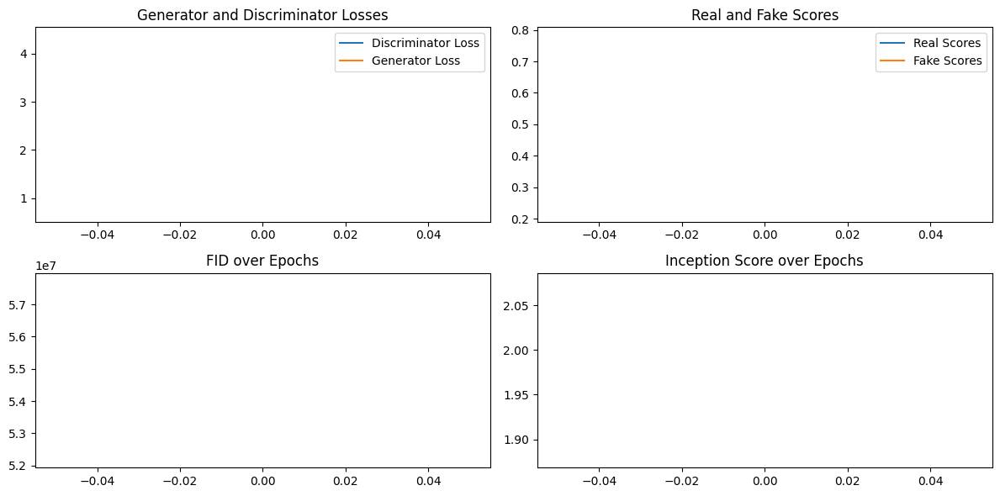

Epoch 2/10


100%|██████████| 1583/1583 [05:39<00:00,  4.66it/s]


d_loss: 0.5944
g_loss: 3.8113
real_scores: 0.8089
fake_scores: 0.1897


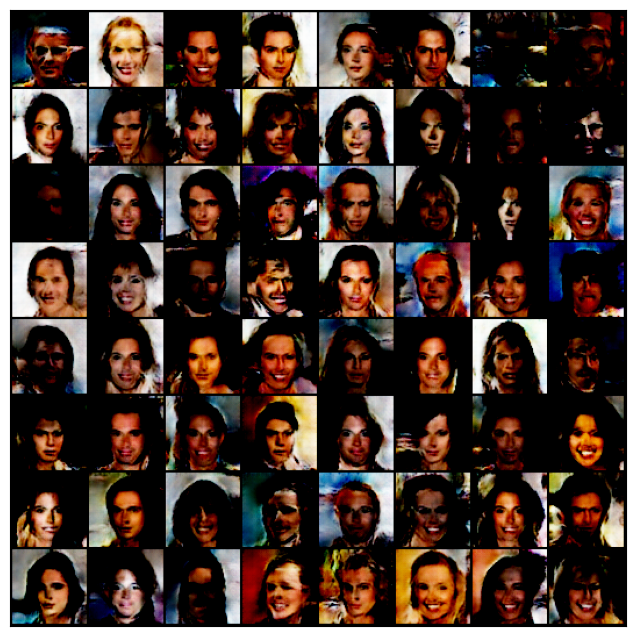

100%|██████████| 2/2 [00:00<00:00, 44.97it/s]


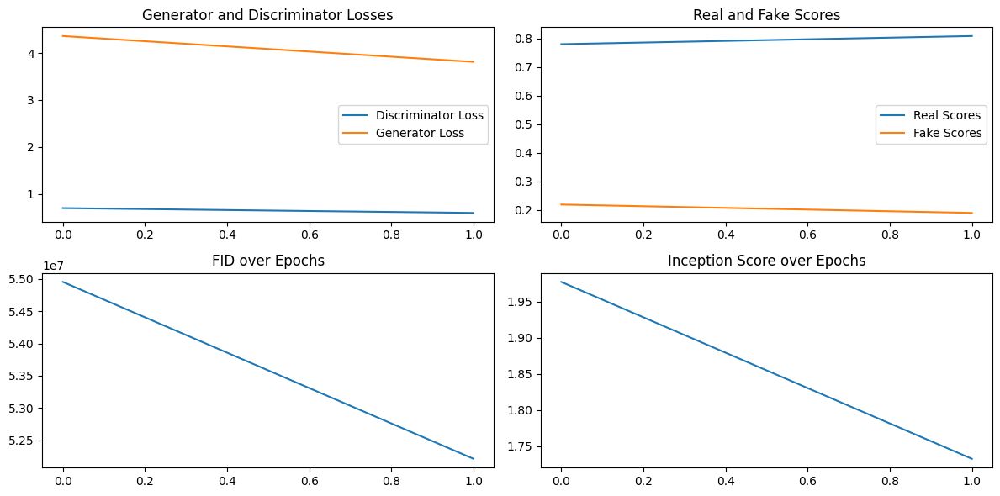

Epoch 3/10


100%|██████████| 1583/1583 [05:42<00:00,  4.62it/s]


d_loss: 0.5387
g_loss: 3.7430
real_scores: 0.8305
fake_scores: 0.1685


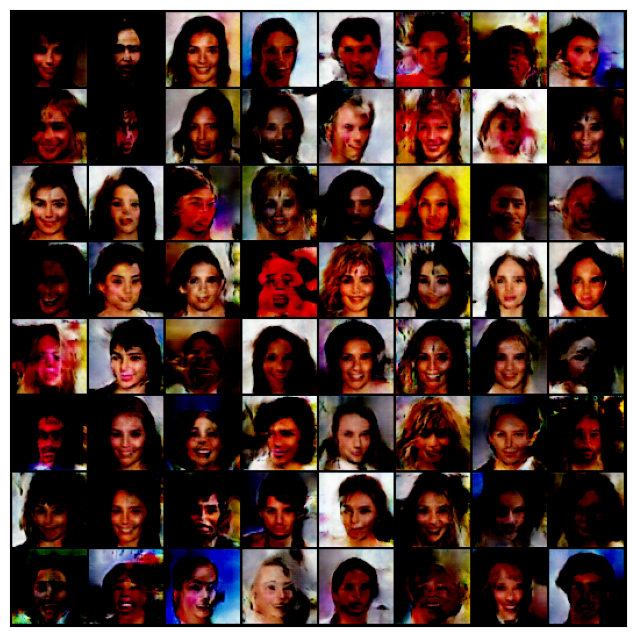

100%|██████████| 2/2 [00:00<00:00, 39.17it/s]


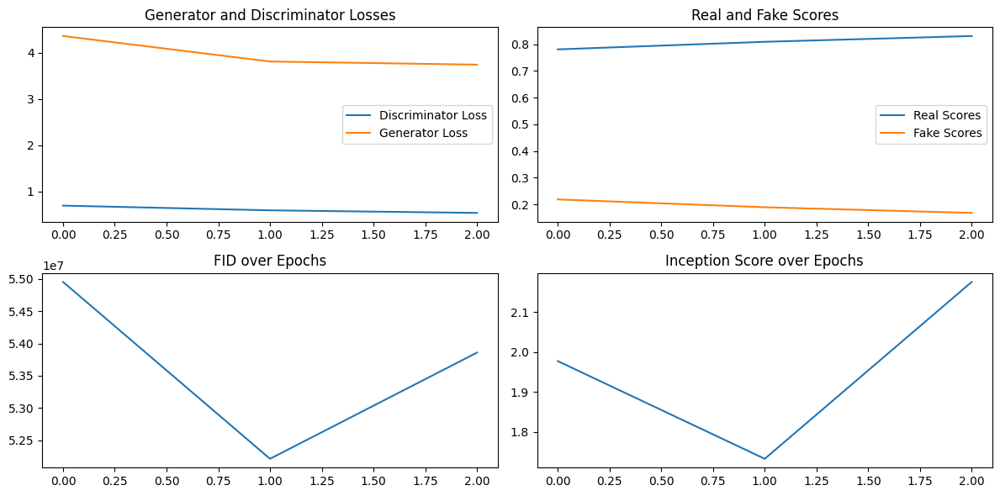

Epoch 4/10


100%|██████████| 1583/1583 [05:51<00:00,  4.51it/s]


d_loss: 0.5085
g_loss: 3.6909
real_scores: 0.8408
fake_scores: 0.1587


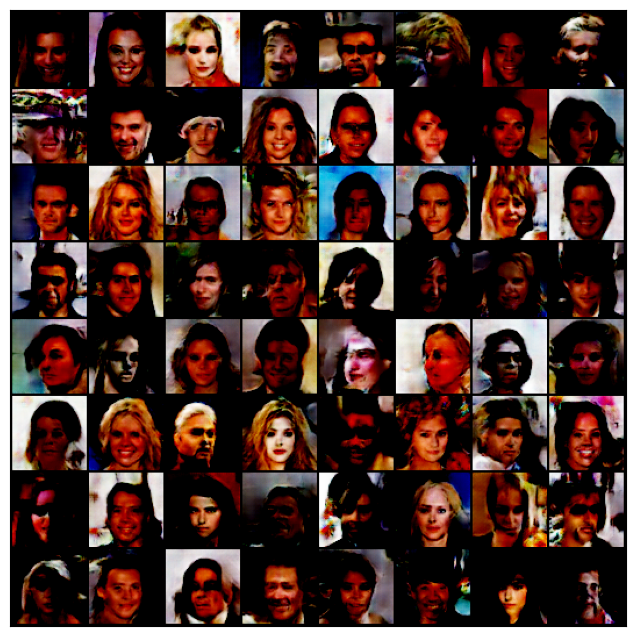

100%|██████████| 2/2 [00:00<00:00, 40.94it/s]


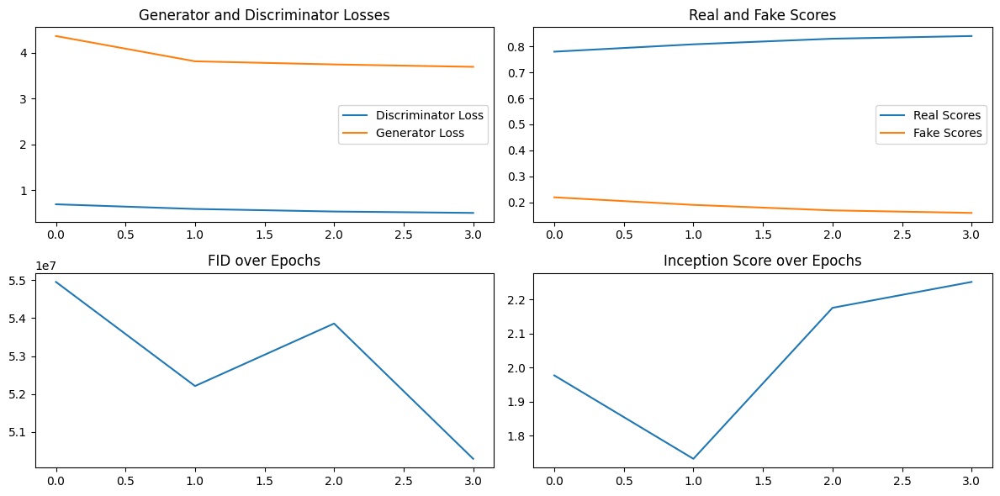

Epoch 5/10


100%|██████████| 1583/1583 [05:55<00:00,  4.45it/s]


d_loss: 0.4559
g_loss: 3.7661
real_scores: 0.8560
fake_scores: 0.1437


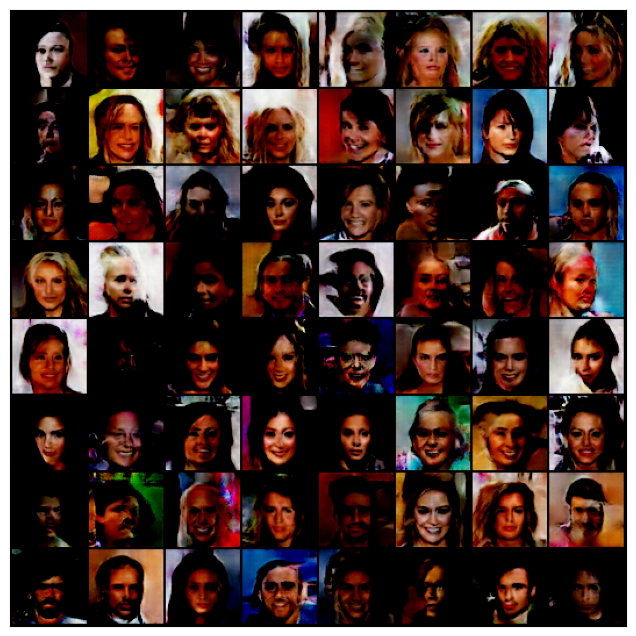

100%|██████████| 2/2 [00:00<00:00, 39.52it/s]


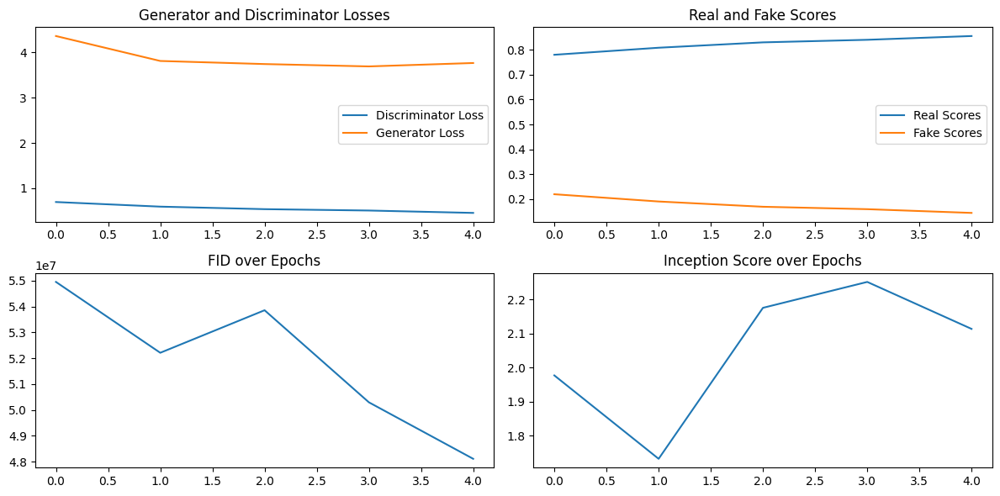

Epoch 6/10


100%|██████████| 1583/1583 [06:05<00:00,  4.33it/s]


d_loss: 0.4378
g_loss: 3.8523
real_scores: 0.8657
fake_scores: 0.1342


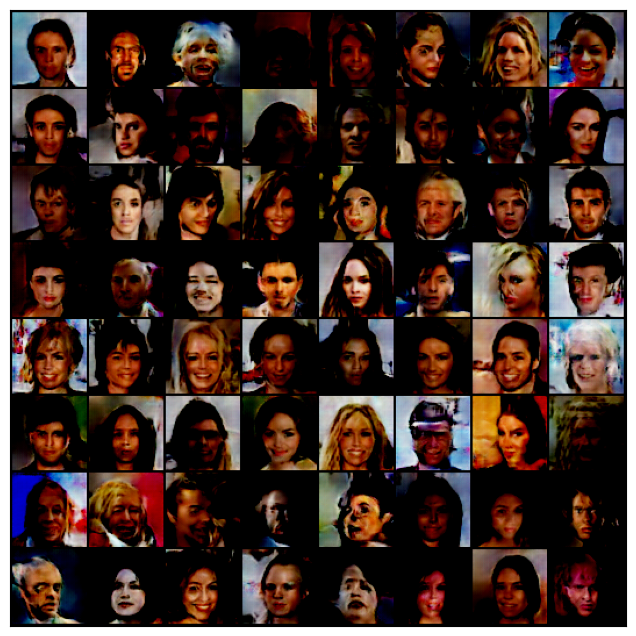

100%|██████████| 2/2 [00:00<00:00, 39.44it/s]


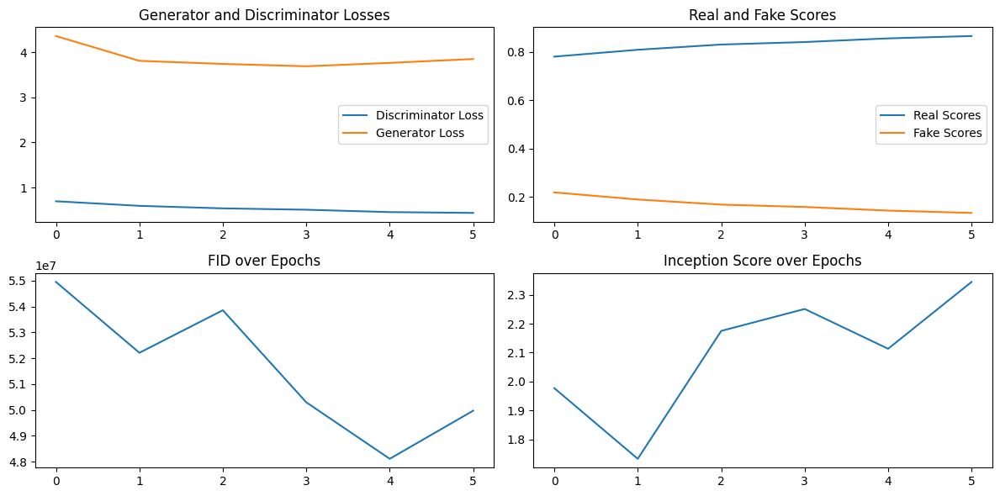

Epoch 7/10


100%|██████████| 1583/1583 [06:09<00:00,  4.29it/s]


d_loss: 0.4004
g_loss: 3.9359
real_scores: 0.8779
fake_scores: 0.1219


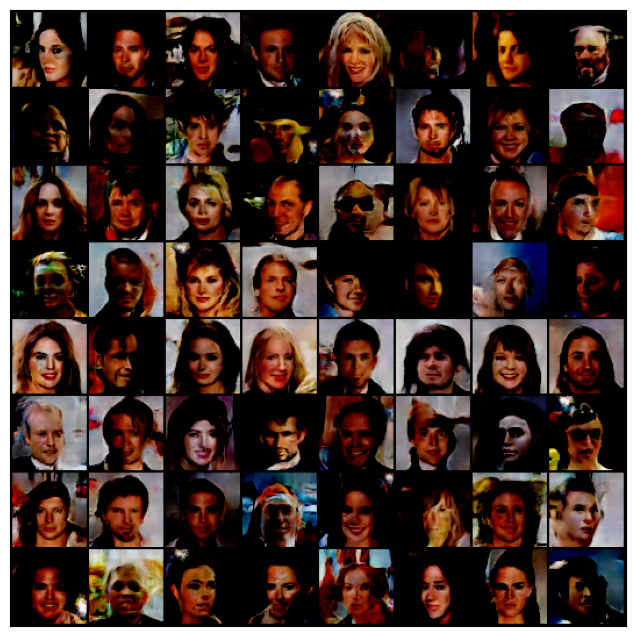

100%|██████████| 2/2 [00:00<00:00, 35.87it/s]


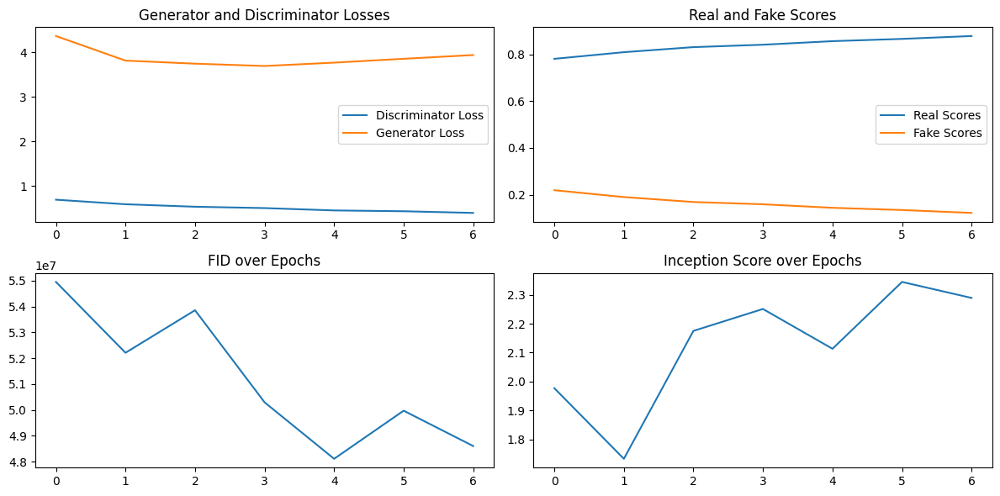

Epoch 8/10


100%|██████████| 1583/1583 [06:19<00:00,  4.17it/s]


d_loss: 0.3727
g_loss: 4.1152
real_scores: 0.8828
fake_scores: 0.1170


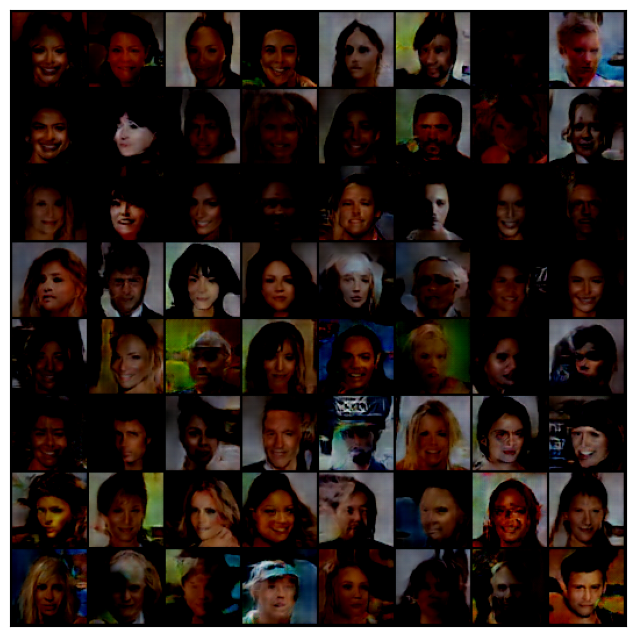

100%|██████████| 2/2 [00:00<00:00, 36.49it/s]


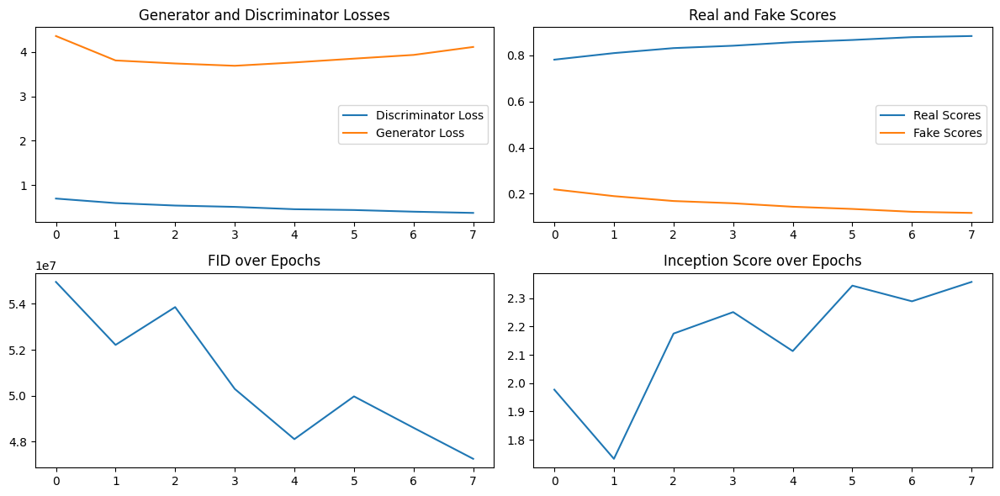

Epoch 9/10


100%|██████████| 1583/1583 [06:17<00:00,  4.19it/s]


d_loss: 0.3620
g_loss: 3.9970
real_scores: 0.8854
fake_scores: 0.1140


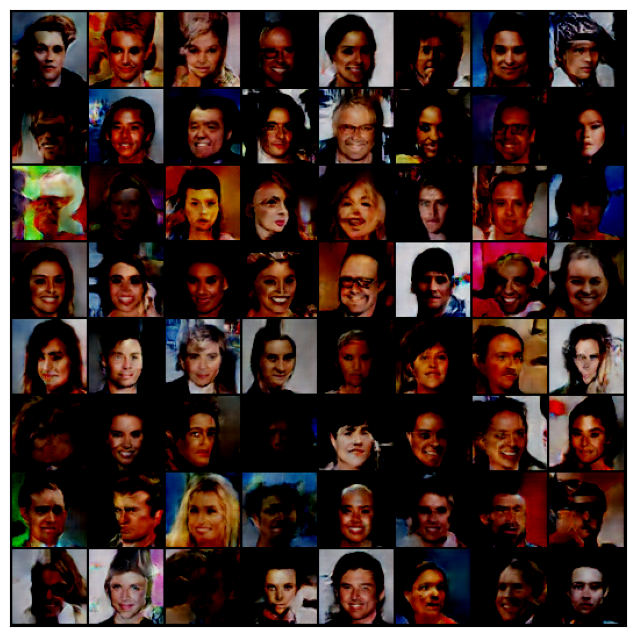

100%|██████████| 2/2 [00:00<00:00, 36.23it/s]


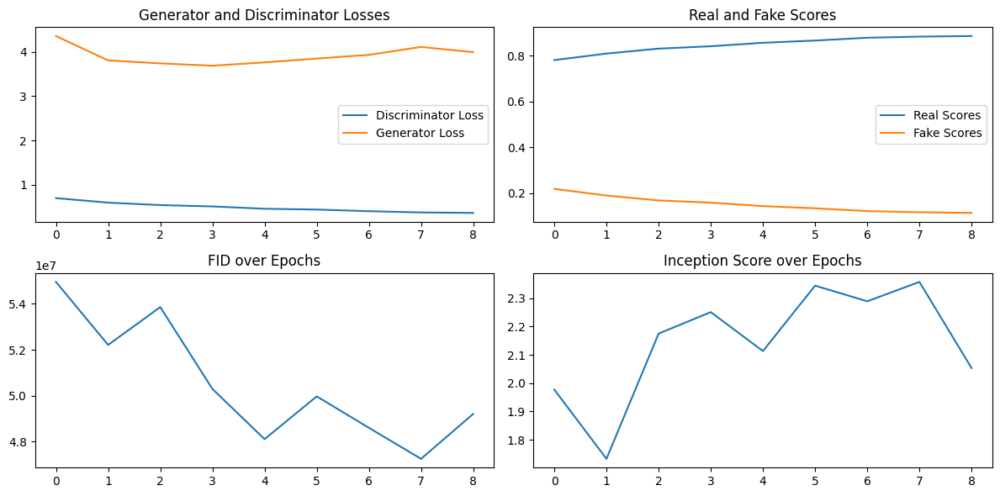

Epoch 10/10


100%|██████████| 1583/1583 [06:33<00:00,  4.02it/s]


d_loss: 0.3668
g_loss: 3.9992
real_scores: 0.8902
fake_scores: 0.1094


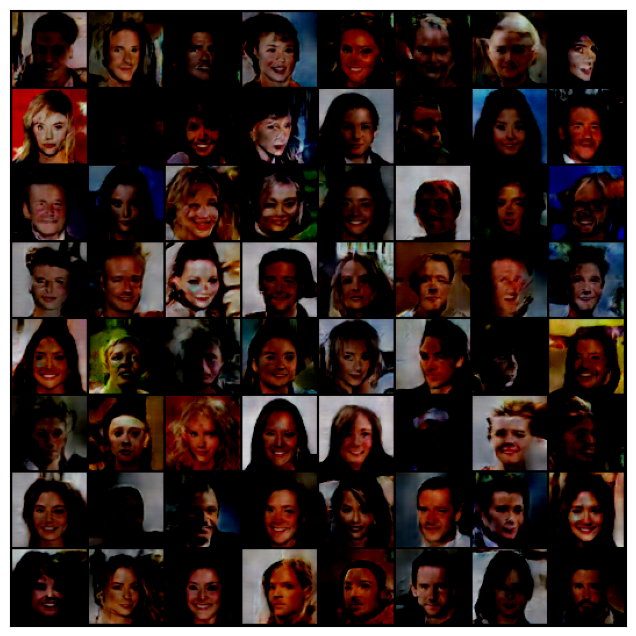

100%|██████████| 2/2 [00:00<00:00, 38.31it/s]


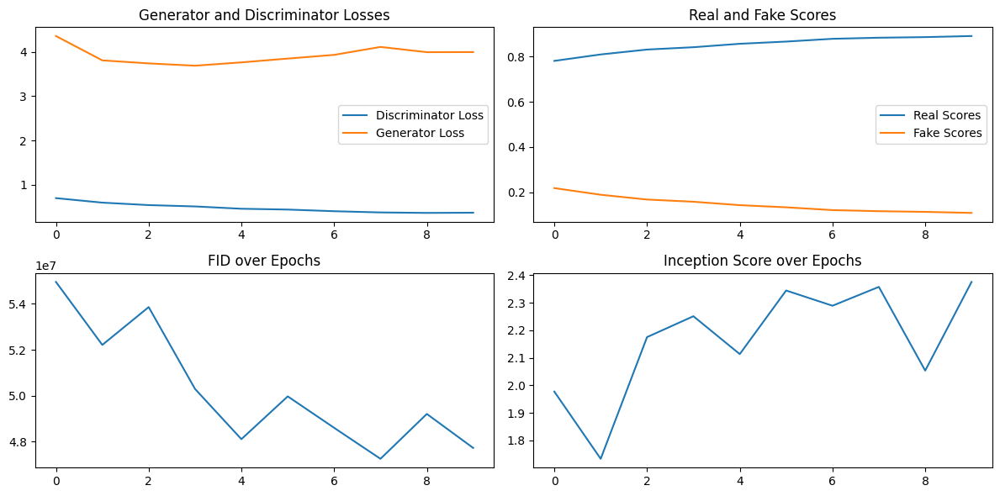

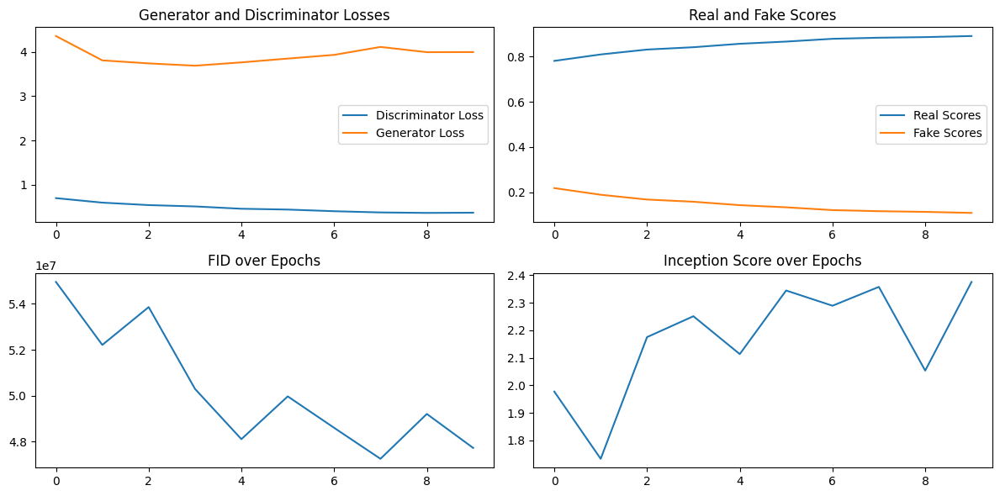

In [ ]:
d = create_discriminator().to(device)
g = create_generator().to(device)

d_optimizer = torch.optim.Adam(d.parameters(), lr=0.0003, betas=(0.5, 0.999))
g_optimizer = torch.optim.Adam(g.parameters(), lr=0.0003, betas=(0.5, 0.999))

history = train_loop(d, g, d_optimizer, g_optimizer, train_loader, 10)

#Dataset & Dataloader for conditional GAN

In [ ]:
data = pd.read_csv('/content/celeba-dataset/list_attr_celeba.csv')
print(data.keys())

Index(['image_id', '5_o_Clock_Shadow', 'Arched_Eyebrows', 'Attractive',
       'Bags_Under_Eyes', 'Bald', 'Bangs', 'Big_Lips', 'Big_Nose',
       'Black_Hair', 'Blond_Hair', 'Blurry', 'Brown_Hair', 'Bushy_Eyebrows',
       'Chubby', 'Double_Chin', 'Eyeglasses', 'Goatee', 'Gray_Hair',
       'Heavy_Makeup', 'High_Cheekbones', 'Male', 'Mouth_Slightly_Open',
       'Mustache', 'Narrow_Eyes', 'No_Beard', 'Oval_Face', 'Pale_Skin',
       'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks', 'Sideburns',
       'Smiling', 'Straight_Hair', 'Wavy_Hair', 'Wearing_Earrings',
       'Wearing_Hat', 'Wearing_Lipstick', 'Wearing_Necklace',
       'Wearing_Necktie', 'Young'],
      dtype='object')


In [ ]:
lst = os.listdir('/content/celeba-dataset/img_align_celeba/img_align_celeba/')
data[data['image_id'] == lst[0]]['Male'].iloc[0], data[data['image_id'] == lst[1]]['Male'].iloc[0]

(1, -1)

In [ ]:
i = 70000
my_list = os.listdir('/content/celeba-dataset/img_align_celeba/img_align_celeba/')
with open('/content/celeba-dataset/img_align_celeba/img_align_celeba.txt', 'w') as file:
    for item in my_list:
      i = i - 1
      if i <0:
        break
      try:
        value = data[data['image_id'] == item]['Male'].iloc[0] + 1
        file.write(f'{item} {int(value/2.)}\n')
      except:
        print('skipped')
        continue


skipped


In [ ]:
from torchvision import datasets, transforms
from torch.utils.data import Dataset

class LimitedImageFolderDataset(Dataset):
    def __init__(self, root, transform=None, limit=None):
        self.image_folder = datasets.ImageFolder(root=root, transform=transform)
        self.limit = limit

    def __len__(self):
        if self.limit is not None:
            return min(len(self.image_folder), self.limit)
        else:
            return len(self.image_folder)

    def __getitem__(self, idx):
        return self.image_folder[idx]


In [ ]:
from torchvision.datasets import ImageFolder
from torchvision.transforms import v2
from torch.utils.data import DataLoader
import torch

batch_size = 64

train_dataset = LimitedImageFolderDataset(root='/content/celeba-dataset/img_align_celeba',
                            transform=v2.Compose([v2.Resize(64),
                                                  v2.CenterCrop(64),
                                                  v2.ToImage(),
                                                  v2.ToDtype(torch.float32, scale=True),
                                                  v2.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))]), limit = 70000)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=1, pin_memory=True,drop_last=True)

In [ ]:
len(train_dataset)

70000

#Building conditional GAN

In [ ]:
import torch.nn as nn

class ConditionalGenerator(nn.Module):
    def __init__(self, num_classes, latent_size=64):
        super(ConditionalGenerator, self).__init__()
        self.latent_size = latent_size
        self.label_embedding = nn.Embedding(num_classes, int(latent_size/2))
        self.generator = nn.Sequential(
            nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),

            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),

            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),

            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),

            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh()
        )
    def forward(self, labels):
        noise = torch.randn(batch_size, int(self.latent_size/2), 1, 1, device=device)
        embedded_labels = self.label_embedding(labels).view(labels.size(0), -1, 1, 1)
        input_noise = torch.cat([noise, embedded_labels], dim=1)

        # print('labels.size(0)', labels.size(0))
        # print('noise', noise.shape)
        # print('embedded_labels0', embedded_labels.shape)
        # print('input_noise', input_noise.shape)
        return self.generator(input_noise)
    # def forward(self, labels):
    #     embedded_labels = self.label_embedding(labels).view(labels.size(0), -1, 1, 1)
    #     return self.generator(embedded_labels)

class ConditionalDiscriminator(nn.Module):
    def __init__(self, num_classes):
        super(ConditionalDiscriminator, self).__init__()

        self.label_embedding = nn.Embedding(num_classes, 64 * 64)  # Adjust the size according to your input image size
        self.discriminator = nn.Sequential(
            nn.Conv2d(4, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),

            nn.Flatten(),
            nn.Sigmoid()
        )

    def forward(self, image, labels):
        embedded_labels = self.label_embedding(labels).view(labels.size(0), 1, 64, 64)  # Adjust the size according to your input image size
        conditioned_image = torch.cat([image, embedded_labels], dim=1)
        return self.discriminator(conditioned_image)

#Training functions for conditional GAN

In [ ]:
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

def plot_fakes(generator, num_samples, latent_dim, num_classes):
    device = next(generator.parameters()).device
    # Generate random labels
    # print('generate_samples 1')
    num_samples = 64
    labels = torch.randint(0, num_classes, (num_samples,), device=device)
    print('labels: ', labels)
    # Generate samples
    # print('num_samples', num_samples)
    fake_images = generator(labels)
    fig, ax = plt.subplots(figsize=(8,8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))
    plt.show()

In [ ]:
def train_conditional_d(d, g, real_images, labels, optimizer):
    # ---- реальные данные ----

    # обнуление накопленных градиентов
    optimizer.zero_grad()

    # предсказания на реальных данных
    real_preds = d(real_images, labels)

    # должны быть везде единички (1 - реальное, 0 - фейк)
    real_targets = torch.ones(real_images.size(0), 1, device=device)

    # считаем потери и метрики для реальных данных
    real_loss = nn.functional.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item() # тут должно быть 1

    # ---- фейковые данные ----
    # print(labels.shape)
    fake_images = g(labels)  # Pass labels to the generator

    # предсказания на фейковых данных
    fake_preds = d(fake_images, labels)

    # должны быть везде нолики (1 - реальное, 0 - фейк)
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)

    # считаем потери и метрики для фейковых данных
    fake_loss = nn.functional.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item() # тут должно быть 0

    # ---- обновление весов ----

    loss = real_loss + fake_loss
    loss.backward()
    optimizer.step()

    return loss.item(), real_score, fake_score


In [ ]:
def train_conditional_g(d, g, labels, optimizer):
    optimizer.zero_grad()


    fake_images = g(labels)  # Pass labels to the generator
    # fake_images = g(labels)  # Pass labels to the generator

    # предсказания дискриминатора
    preds = d(fake_images, labels)  # Pass labels to the discriminator
    targets = torch.ones(batch_size, 1, device=device)
    targets = torch.ones_like(preds) if labels != None else torch.zeros_like(preds)

    # Ensure that targets have the same size as preds
    targets = targets.view_as(preds)
    loss = nn.functional.binary_cross_entropy(preds, targets)

    loss.backward()
    optimizer.step()

    return loss.item()


In [ ]:
!mkdir '/content/drive/MyDrive/saved_models'
!mkdir '/content/drive/MyDrive/saved_models/conditional'

mkdir: cannot create directory ‘/content/drive/MyDrive/saved_models’: File exists
mkdir: cannot create directory ‘/content/drive/MyDrive/saved_models/conditional’: File exists


In [ ]:
import torch

def generate_samples(generator, num_samples, latent_dim, num_classes):
    device = next(generator.parameters()).device
    # Generate random labels
    # print('generate_samples 1')
    num_samples = 64
    labels = torch.randint(0, num_classes, (num_samples,), device=device)

    # Generate samples
    # print('num_samples', num_samples)
    generated_samples = generator(labels)

    return generated_samples, labels


In [ ]:
torch.backends.cuda.split_tensor_minsize = 1

In [ ]:
import os
import torchvision.utils as vutils
def save_generated_samples(generator, epoch, num_samples=64, latent_dim=64, num_classes=2, device='cuda'):
    generator.eval()

    # Generate fake sample
    labels = torch.randint(0, num_classes, (num_samples,), device=device)
    fake_samples = generator( labels)

    # Create a directory to save generated samples
    os.makedirs(f'/content/drive/MyDrive/saved_samples/cv4/epoch_{epoch}', exist_ok=True)

    # Save generated samples as images
    for i in range(num_samples):
        vutils.save_image(fake_samples[i, :, :, :].detach(), f'/content/drive/MyDrive/saved_samples/cv4/epoch_{epoch}/fake_sample_{i + 1}.png')

    generator.train()

In [ ]:
!mkdir '/content/drive/MyDrive/saved_models/cv4'

mkdir: cannot create directory ‘/content/drive/MyDrive/saved_models/cv4’: File exists


##calculate FID

In [ ]:
import torch
from torchvision.models import inception_v3
from torchvision.transforms import functional as F
from scipy.linalg import sqrtm
from tqdm import tqdm

def torch_cov(m, rowvar=False):
    """Estimate a covariance matrix given data."""
    if m.dim() > 2:
        raise ValueError("m has more than 2 dimensions")
    if m.dim() < 2:
        m = m.view(1, -1)
    if not rowvar and m.size(0) != 1:
        m = m.t()
    fact = 1.0 / (m.size(0) - 1)
    m -= torch.mean(m, dim=0, keepdim=True)
    mt = m.t()  # if complex: mt = m.t().conj()
    return fact * m.matmul(mt).squeeze()

def calculate_frechet_distance(mu1, sigma1, mu2, sigma2):
    """Calculate Frechet distance between two multivariate Gaussians."""
    eps = 1e-6
    sqrt_term = torch.norm(sigma1 @ sigma2, p='fro')
    mu_diff = mu1 - mu2
    cov_term = torch.trace(sigma1 + sigma2 - 2 * sqrtm(sigma1 @ sigma2 + eps))

    return mu_diff.norm() + cov_term + sqrt_term

def calculate_fid_from_scratch(real_loader, generated_samples, device='cuda', batch_size=64, dims=64):
    model = inception_v3(pretrained=True, aux_logits=True).to(device).eval()

    # Get InceptionV3 features for real samples
    real_preds = []

    for real_images, _ in tqdm(real_loader):
        real_images = real_images.to(device)
        real_images_resized = F.resize(real_images, (299, 299))
        real_preds.append(model(real_images_resized).detach())

    real_preds = torch.cat(real_preds, dim=0)
    mu1, sigma1 = real_preds.mean(dim=0).cpu(), torch_cov(real_preds, rowvar=False).cpu()

    # Get InceptionV3 features for generated samples
    generated_preds = []

    for i in tqdm(range(0, len(generated_samples), batch_size)):
        generated_batch = generated_samples[i:i + batch_size].to(device)
        generated_batch_resized = F.resize(generated_batch, (299, 299))
        generated_preds.append(model(generated_batch_resized).detach())

    generated_preds = torch.cat(generated_preds, dim=0)
    mu2, sigma2 = generated_preds.mean(dim=0).cpu(), torch_cov(generated_preds, rowvar=False).cpu()

    # Calculate FID
    fid_value = calculate_frechet_distance(mu1, sigma1, mu2, sigma2)

    return fid_value


##calculate IS

In [ ]:
import torch
from torchvision.models import inception_v3
from torchvision import transforms
from torch.utils.data import DataLoader

def calculate_inception_score(generator, num_classes, num_samples, device, batch_size=64, num_splits=10):
    # Set the generator to evaluation mode
    generator.eval()

    # Generate fake images
    # fake_images, _ = generate_fake_images(generator, num_classes, num_images, device)
    fake_images, _ = generate_samples(generator, num_samples, 64, num_classes)

    # Resize and normalize images for Inception model
    transform = transforms.Compose([
        transforms.Resize((299, 299)),
        # transforms.ToTensor(),
        transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
    ])
    fake_images = torch.stack([transform(image) for image in fake_images])

    # Create a DataLoader for the generated images
    fake_dataset = torch.utils.data.TensorDataset(fake_images)
    fake_dataloader = DataLoader(fake_dataset, batch_size=batch_size, shuffle=False)

    # Load the Inception model
    inception_model = inception_v3(pretrained=True, transform_input=False).to(device)
    inception_model.eval()

    # Function to calculate the Inception Score
    def inception_score(images, num_splits):
        scores = []
        for i in range(num_splits):
            start_idx = i * (len(images) // num_splits)
            end_idx = (i + 1) * (len(images) // num_splits)

            batch = images[start_idx:end_idx]
            batch_scores = torch.nn.functional.softmax(inception_model(batch), dim=1)
            scores.append(batch_scores)

        scores = torch.cat(scores, dim=0)
        kl_divergence = scores * (torch.log(scores) - torch.log(torch.mean(scores, dim=0)))
        score = torch.exp(torch.mean(torch.sum(kl_divergence, dim=1)))

        return score.item()

    # Calculate Inception Score
    inception_score_value = inception_score(fake_images, num_splits)

    # Set the generator back to training mode
    generator.train()

    return inception_score_value



##train_conditional_loop

In [ ]:
from tqdm import tqdm
import pickle
from tqdm import tqdm
import pickle
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from torchvision.utils import save_image
from pytorch_fid import fid_score
from pytorch_pretrained_biggan import BigGAN
def train_conditional_loop(d, g, d_optimizer, g_optimizer, train_loader, epochs):
    d_losses = []
    g_losses = []
    real_scores = []
    fake_scores = []
    fid_values = []
    is_means = []
    is_stds = []
    inseption_scores = []
    n = len(train_loader)

    for epoch in range(epochs):
        print(f'Epoch {epoch+1}')

        running_d_loss = 0.
        running_g_loss = 0.
        running_real_score = 0.
        running_fake_score = 0.
        # inseption_score = calculate_inception_score(g, 2, 64, device)

        # print(epoch ,' went there')

        for real_images, labels in tqdm(train_loader):
            real_images = real_images.to(device)
            labels = labels.to(device).view(64)
            # print('entering ', epoch, labels.shape)
            d_loss, real_score, fake_score = train_conditional_d(d, g, real_images, labels, d_optimizer)
            # print('passing ')
            g_loss = train_conditional_g(d, g, labels, g_optimizer)

            running_d_loss += d_loss
            running_g_loss += g_loss
            running_real_score += real_score
            running_fake_score += fake_score

        # print(epoch ,' crossed there')
        running_d_loss /= n
        running_g_loss /= n
        running_real_score /= n
        running_fake_score /= n

        d_losses.append(running_d_loss)
        g_losses.append(running_g_loss)
        real_scores.append(running_real_score)
        fake_scores.append(running_fake_score)

        print('d_loss: {:.4f}'.format(running_d_loss))
        print('g_loss: {:.4f}'.format(running_g_loss))
        print('real_scores: {:.4f}'.format(running_real_score))
        print('fake_scores: {:.4f}'.format(running_fake_score))

        # Generate fake samples for FID calculation
        latent_dim = 64
        num_classes = 2
        # print(epoch ,' went here')
        fake_samples, _ = generate_samples(g, len(train_loader.dataset), latent_dim, num_classes)

        # print(epoch ,' crossed here')
        # Save generated samples at the end of each epoch
        save_generated_samples(g, epoch)
        # Calculate FID
        fid_value = calculate_fid_from_scratch(train_loader, fake_samples, device=device)
        inseption_score = calculate_inception_score(g, num_classes, 64, device)

        fid_values.append(fid_value)
        inseption_scores.append(inseption_score)
        print(f'FID: {fid_value}, inseption_scores: {inseption_score}')
        # Calculate IS
        # is_mean, is_std = inception_score(fake_samples, g)
        # is_means.append(is_mean)
        # is_stds.append(is_std)
        plot_fakes(g, len(train_loader.dataset), latent_dim, num_classes)
        plot_learning_curves(d_losses, g_losses, real_scores, fake_scores, fid_values, inseption_scores) #, is_means, is_stds)

        # Save generated samples at the end of each epoch
        save_generated_samples(g, epoch)

        # Save model checkpoints
        torch.save(d.state_dict(), f'/content/drive/MyDrive/saved_models/cv4/d_{epoch+1}.pth')
        torch.save(g.state_dict(), f'/content/drive/MyDrive/saved_models/cv4/g_{epoch+1}.pth')


    # Save final learning curves
    save_learning_curves(d_losses, g_losses, real_scores, fake_scores, fid_values, is_means, is_stds)

    history = {'d_losses': d_losses,
               'g_losses': g_losses,
               'real_scores': real_scores,
               'fake_scores': fake_scores,
               'fid_values': fid_values,
               'inseption_scores': inseption_scores
              #  'is_means': is_means,
              #  'is_stds': is_stds
               }

    with open('/content/drive/MyDrive/saved_models/cv4/history.pkl', 'wb') as handle:
        pickle.dump(history, handle, protocol=pickle.HIGHEST_PROTOCOL)

    return history

def plot_learning_curves(d_losses, g_losses, real_scores, fake_scores, fid_values, inseption_scores):#, is_means, is_stds):
    plt.figure(figsize=(12, 6))

    plt.subplot(2, 2, 1)
    plt.plot(d_losses, label='Discriminator Loss')
    plt.plot(g_losses, label='Generator Loss')
    plt.title('Generator and Discriminator Losses')
    plt.legend()

    plt.subplot(2, 2, 2)
    plt.plot(real_scores, label='Real Scores')
    plt.plot(fake_scores, label='Fake Scores')
    plt.title('Real and Fake Scores')
    plt.legend()

    plt.subplot(2, 2, 3)
    plt.plot(fid_values, label='FID')
    plt.title('FID over Epochs')

    plt.subplot(2, 2, 4)
    plt.plot(inseption_scores, label='inseption score')
    # plt.plot(is_stds, label='IS Std')
    plt.title('Inception Score over Epochs')
    # plt.subplot(2, 2, 4)
    # plt.plot(is_means, label='IS Mean')
    # plt.plot(is_stds, label='IS Std')
    # plt.title('Inception Score over Epochs')

    plt.tight_layout()
    plt.show()

# def save_generated_samples(generator, epoch, num_samples=5):
#     # Generate fake samples
#     latent_dim = 64
#     num_classes = 2
#     labels = torch.randint(0, num_classes, (num_samples,), device=device)
#     fake_samples = generator(labels).detach()

#     # Save generated samples
#     save_image(fake_samples, f'/content/drive/MyDrive/saved_models/cv4/generated_samples_epoch_{epoch+1}.png', nrow=num_samples, normalize=True)

def save_learning_curves(d_losses, g_losses, real_scores, fake_scores, fid_values, is_means, is_stds):
    # Save learning curves
    plt.figure(figsize=(12, 6))

    plt.subplot(2, 2, 1)
    plt.plot(d_losses, label='Discriminator Loss')
    plt.plot(g_losses, label='Generator Loss')
    plt.title('Generator and Discriminator Losses')
    plt.legend()

    plt.subplot(2, 2, 2)
    plt.plot(real_scores, label='Real Scores')
    plt.plot(fake_scores, label='Fake Scores')
    plt.title('Real and Fake Scores')
    plt.legend()

    plt.subplot(2, 2, 3)
    plt.plot(fid_values, label='FID')
    plt.title('FID over Epochs')

    plt.subplot(2, 2, 4)
    plt.plot(is_means, label='IS Mean')
    plt.plot(is_stds, label='IS Std')
    plt.title('Inception Score over Epochs')

    plt.tight_layout()
    plt.savefig('/content/drive/MyDrive/saved_models/cv4/learning_curves.png')
    plt.close()



#training conditional

Epoch 1


100%|██████████| 1093/1093 [02:22<00:00,  7.66it/s]


d_loss: 0.9545
g_loss: 3.5921
real_scores: 0.7052
fake_scores: 0.2974


100%|██████████| 1/1 [00:00<00:00, 51.44it/s]


FID: (605412.625-1.358460783958435j), inseption_scores: 2.444837808609009


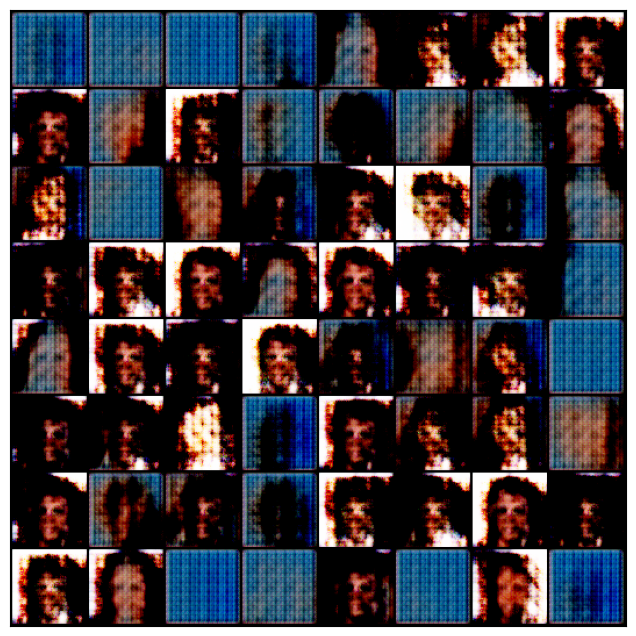

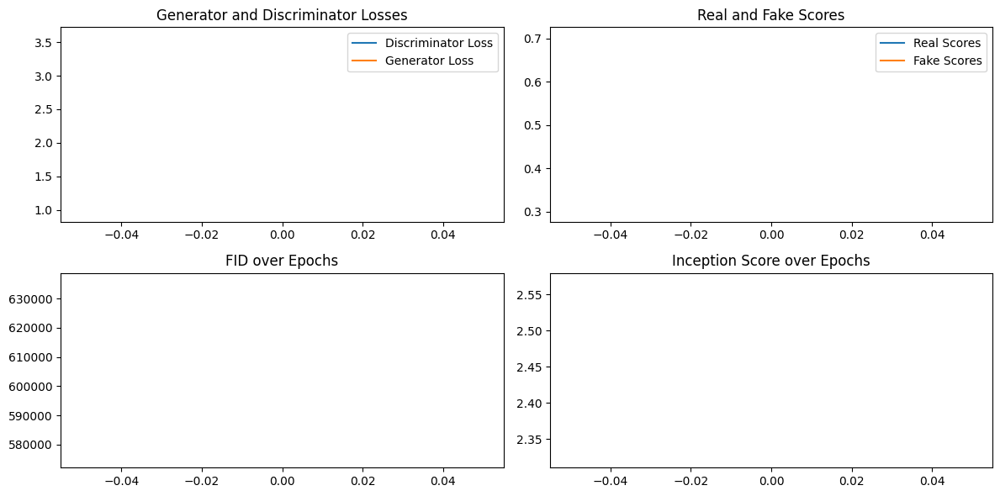

Epoch 2


100%|██████████| 1093/1093 [02:23<00:00,  7.64it/s]


d_loss: 0.8716
g_loss: 3.3879
real_scores: 0.7154
fake_scores: 0.2846


100%|██████████| 1/1 [00:00<00:00, 42.77it/s]


FID: (2423786.5-2.636855125427246j), inseption_scores: 2.5692455768585205


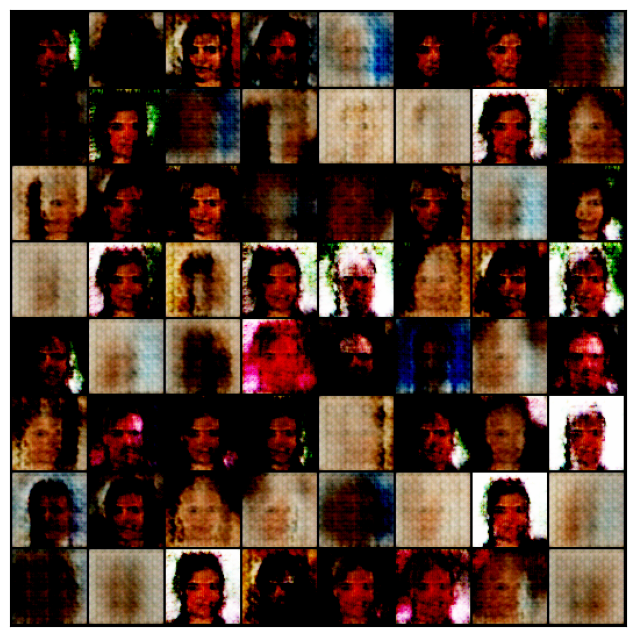

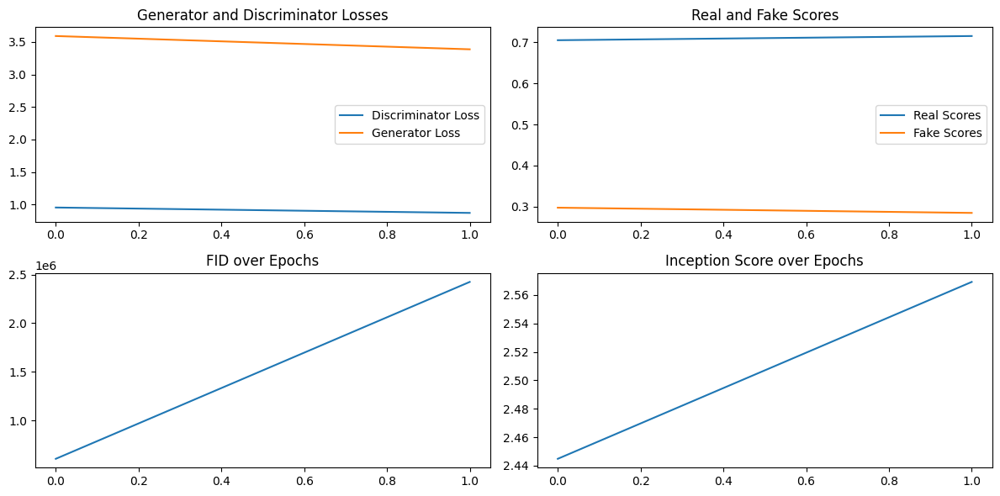

Epoch 3


100%|██████████| 1093/1093 [02:25<00:00,  7.51it/s]


d_loss: 0.8104
g_loss: 3.5076
real_scores: 0.7341
fake_scores: 0.2635


100%|██████████| 1/1 [00:00<00:00, 35.21it/s]


FID: (1671161.25-2.184356212615967j), inseption_scores: 3.221877336502075


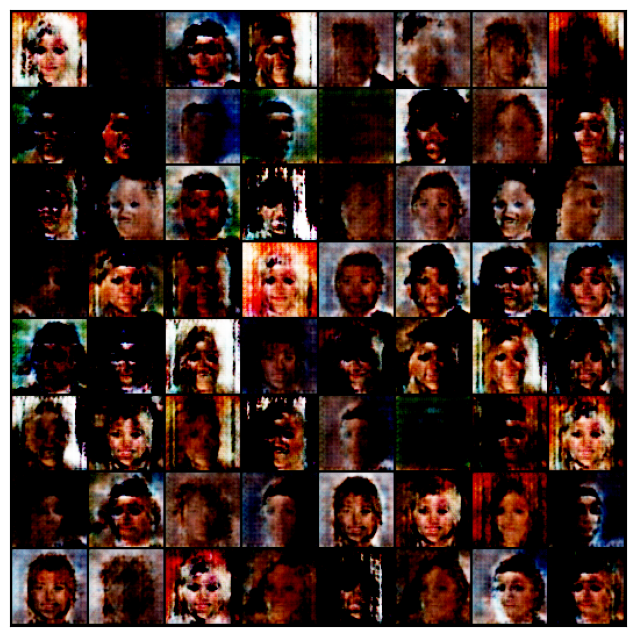

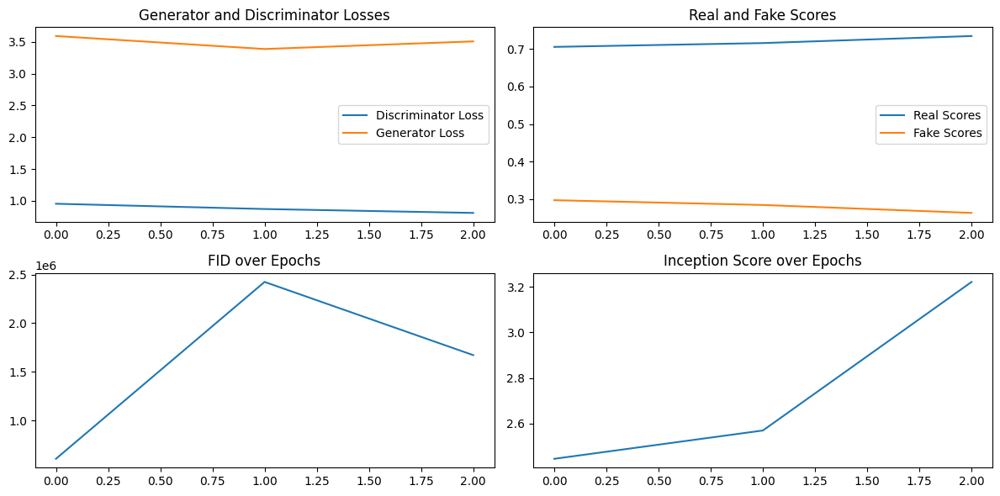

Epoch 4


100%|██████████| 1093/1093 [02:30<00:00,  7.26it/s]


d_loss: 0.6308
g_loss: 3.9850
real_scores: 0.7911
fake_scores: 0.2069


100%|██████████| 1/1 [00:00<00:00, 37.41it/s]


FID: (2781318.25-2.5785608291625977j), inseption_scores: 3.1935617923736572


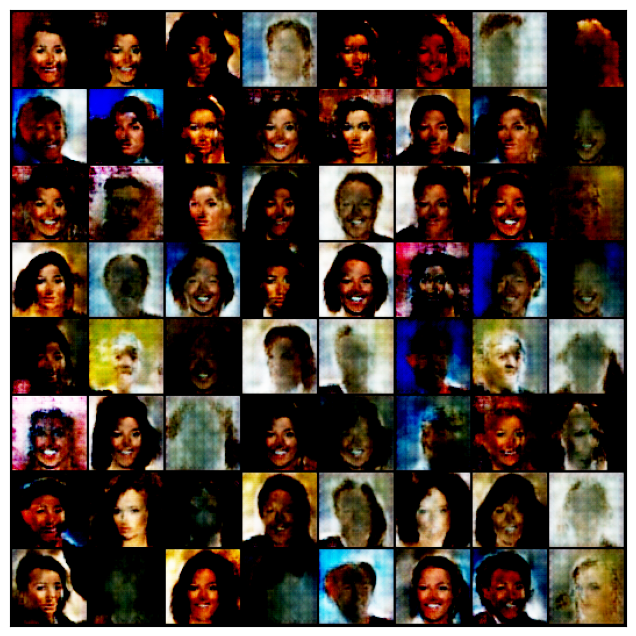

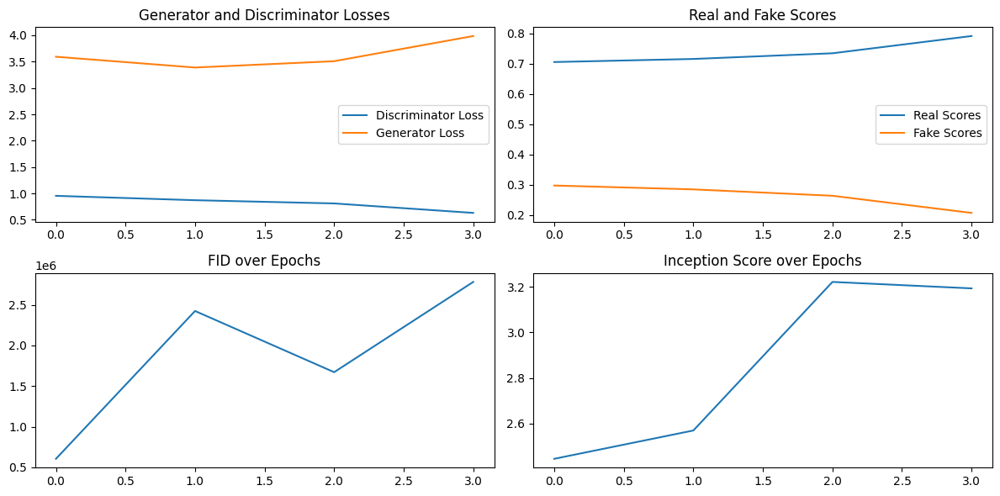

Epoch 5


100%|██████████| 1093/1093 [02:33<00:00,  7.12it/s]


d_loss: 0.5769
g_loss: 3.9534
real_scores: 0.8105
fake_scores: 0.1879


100%|██████████| 1/1 [00:00<00:00, 37.73it/s]


FID: (3340590-2.9985334873199463j), inseption_scores: 3.566760301589966


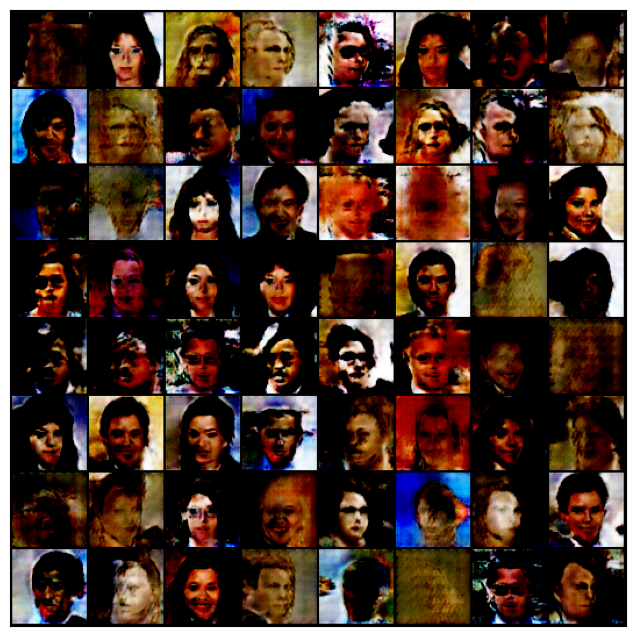

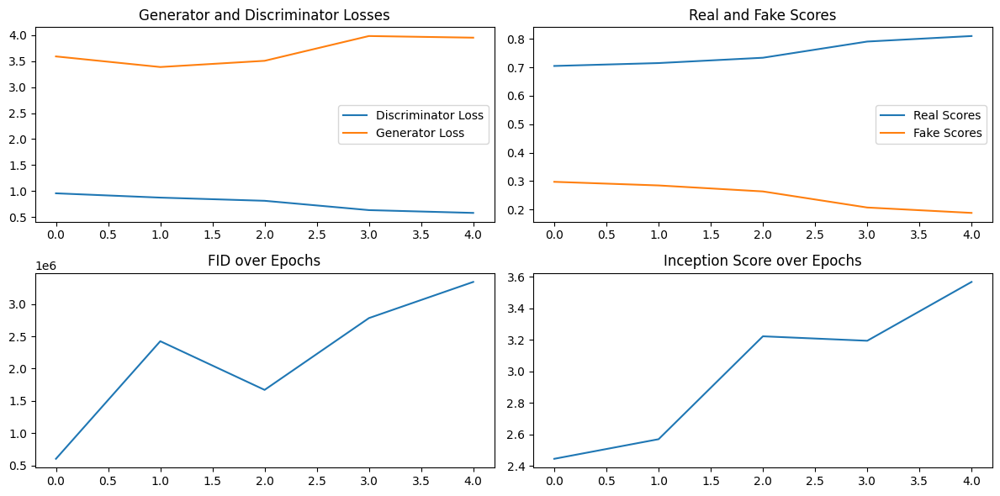

Epoch 6


100%|██████████| 1093/1093 [02:52<00:00,  6.34it/s]


d_loss: 0.5325
g_loss: 3.9159
real_scores: 0.8252
fake_scores: 0.1734


100%|██████████| 1/1 [00:00<00:00, 30.90it/s]


FID: (3450155.25-2.5179693698883057j), inseption_scores: 3.6396219730377197


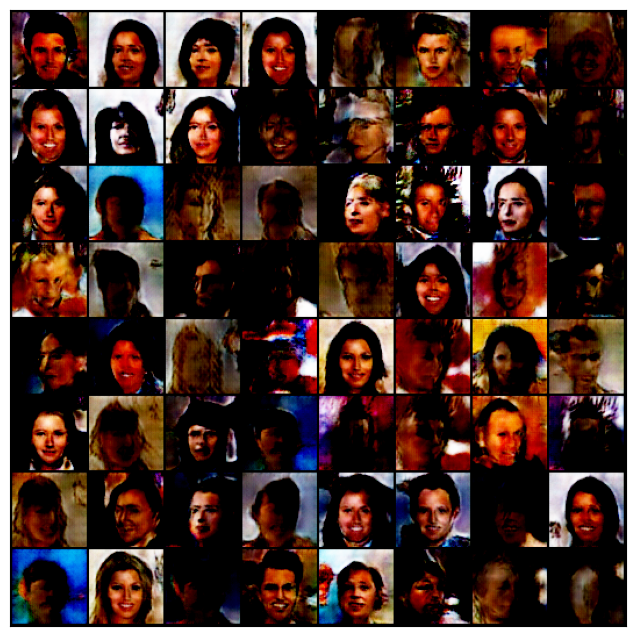

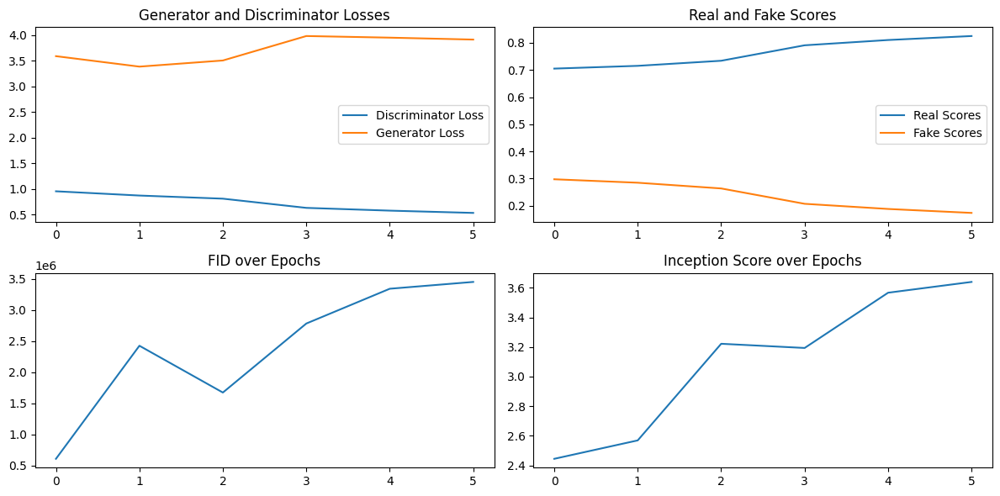

Epoch 7


100%|██████████| 1093/1093 [02:41<00:00,  6.78it/s]


d_loss: 0.5335
g_loss: 3.6769
real_scores: 0.8265
fake_scores: 0.1731


100%|██████████| 1/1 [00:00<00:00, 38.31it/s]


FID: (3144007-3.7761056423187256j), inseption_scores: 3.0627260208129883


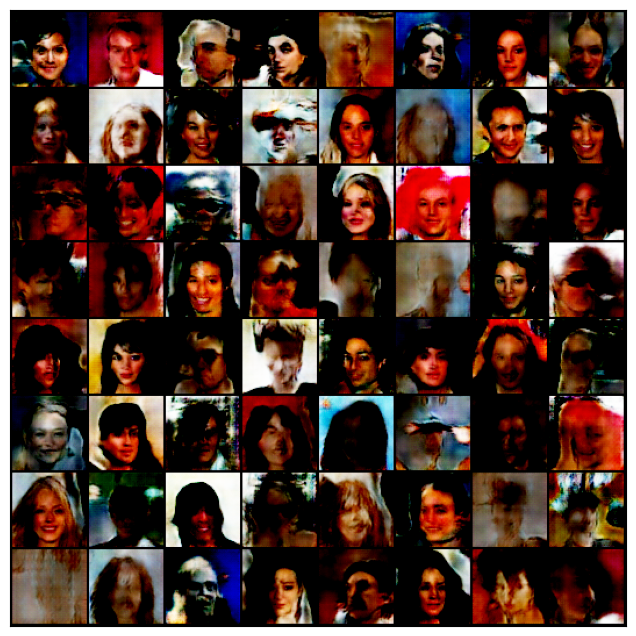

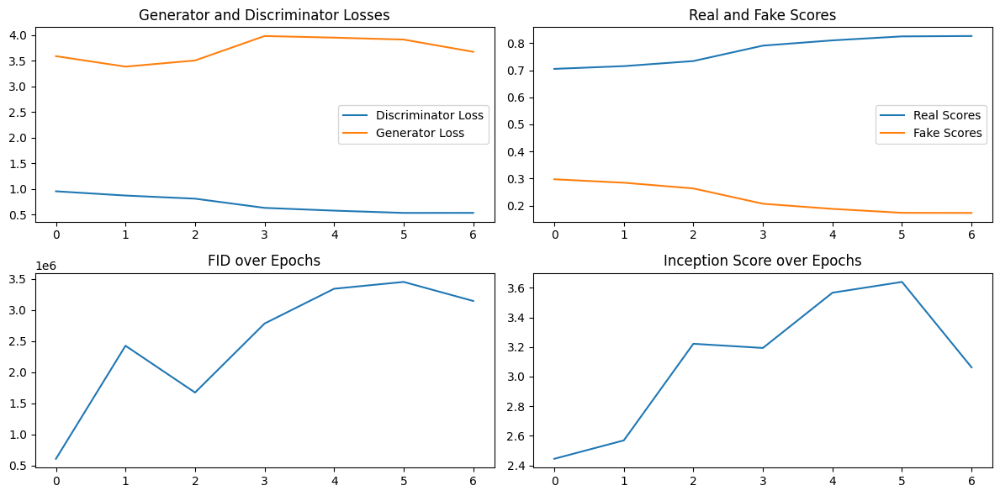

Epoch 8


100%|██████████| 1093/1093 [02:45<00:00,  6.61it/s]


d_loss: 0.5217
g_loss: 3.5977
real_scores: 0.8303
fake_scores: 0.1686


100%|██████████| 1/1 [00:00<00:00, 34.35it/s]


FID: (3372452.25-2.348956346511841j), inseption_scores: 3.416123390197754


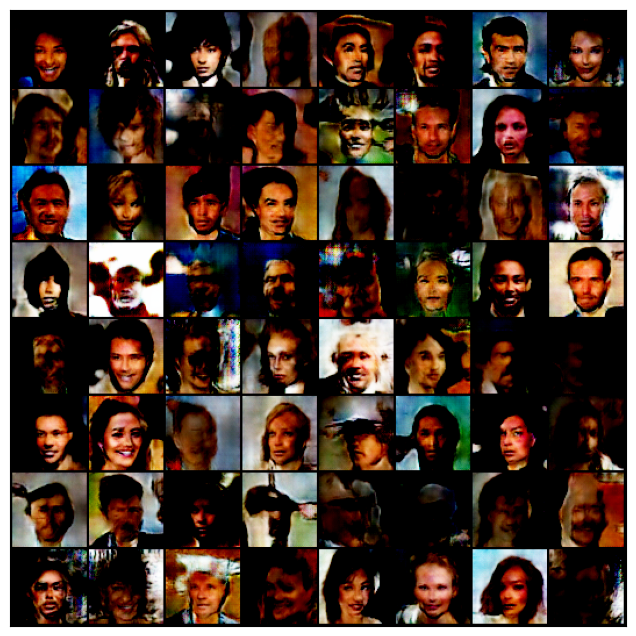

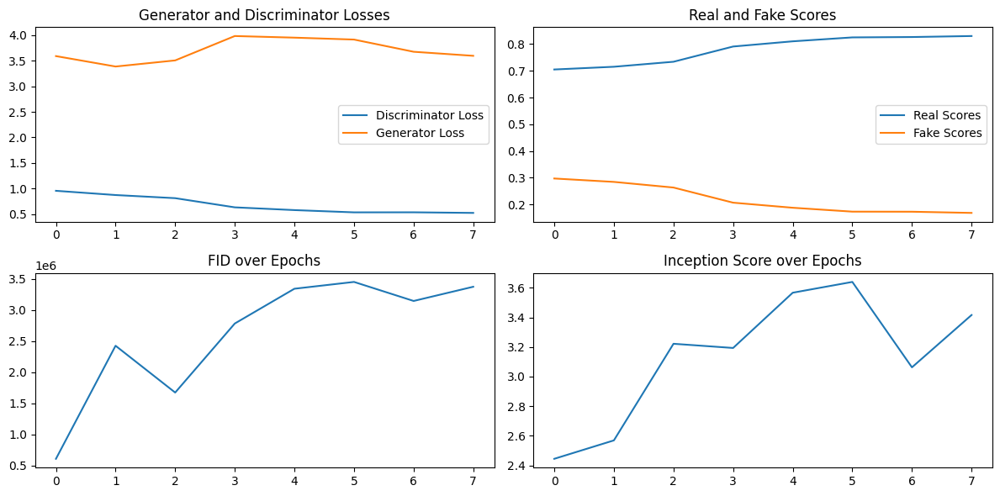

Epoch 9


100%|██████████| 1093/1093 [02:49<00:00,  6.44it/s]


d_loss: 0.4822
g_loss: 3.7058
real_scores: 0.8443
fake_scores: 0.1552


100%|██████████| 1/1 [00:00<00:00, 38.60it/s]


FID: (3163947.75-3.9471583366394043j), inseption_scores: 2.7421698570251465


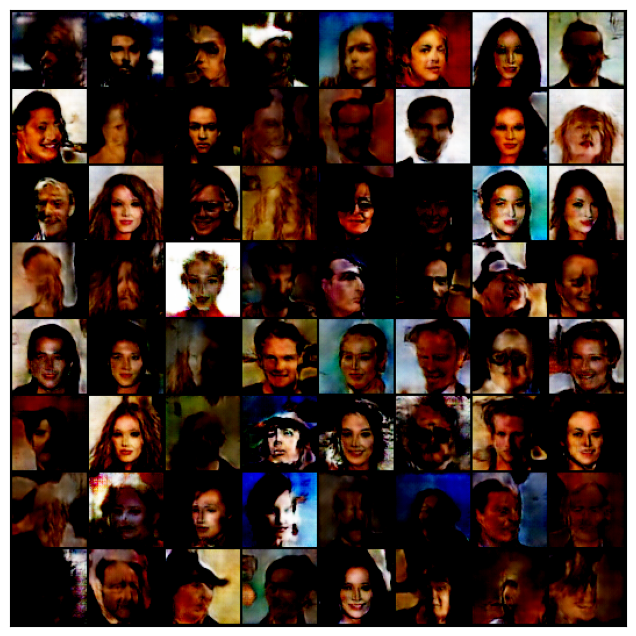

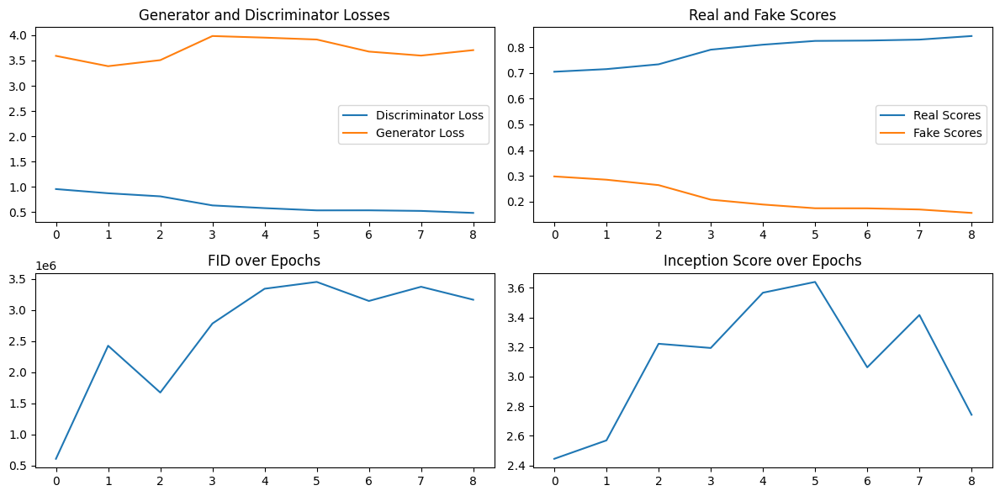

Epoch 10


100%|██████████| 1093/1093 [02:59<00:00,  6.09it/s]


d_loss: 0.4368
g_loss: 3.7847
real_scores: 0.8608
fake_scores: 0.1387


100%|██████████| 1/1 [00:00<00:00, 35.56it/s]


FID: (3488047.5-3.670706033706665j), inseption_scores: 3.0617713928222656


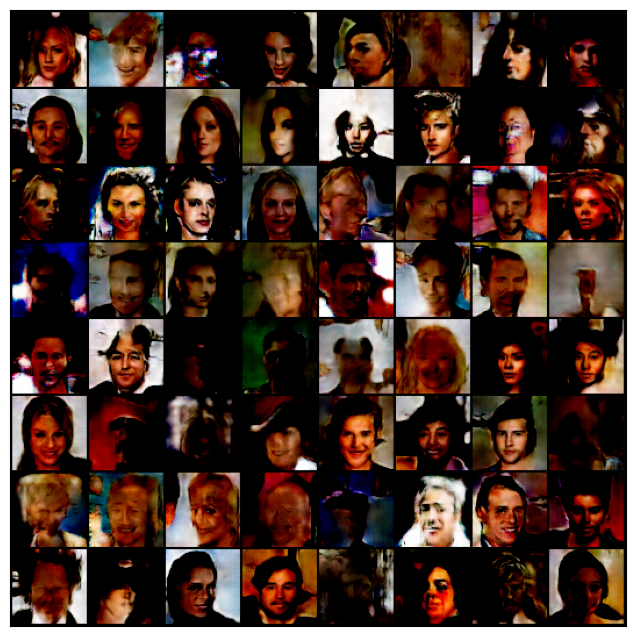

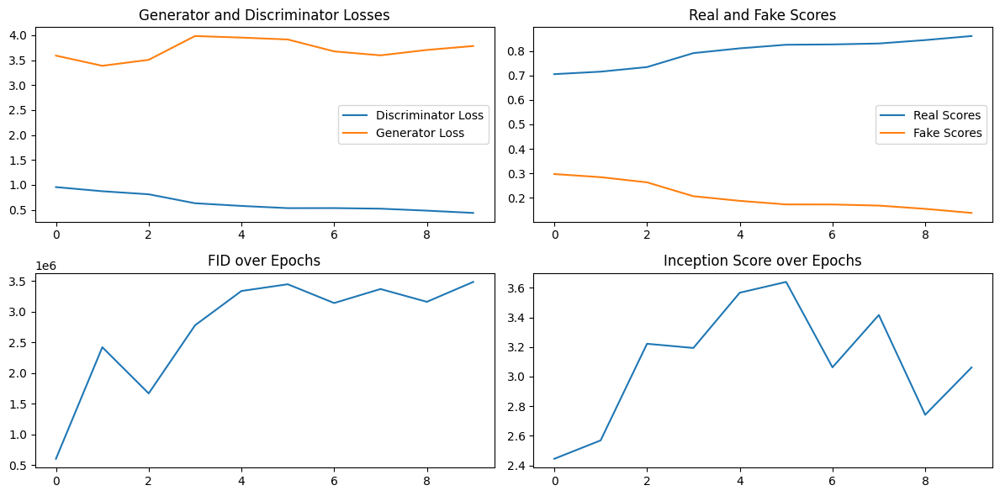

Epoch 11


100%|██████████| 1093/1093 [03:04<00:00,  5.91it/s]


d_loss: 0.4394
g_loss: 3.9080
real_scores: 0.8638
fake_scores: 0.1360


100%|██████████| 1/1 [00:00<00:00, 33.69it/s]


FID: (3966002-3.348062038421631j), inseption_scores: 3.305124044418335


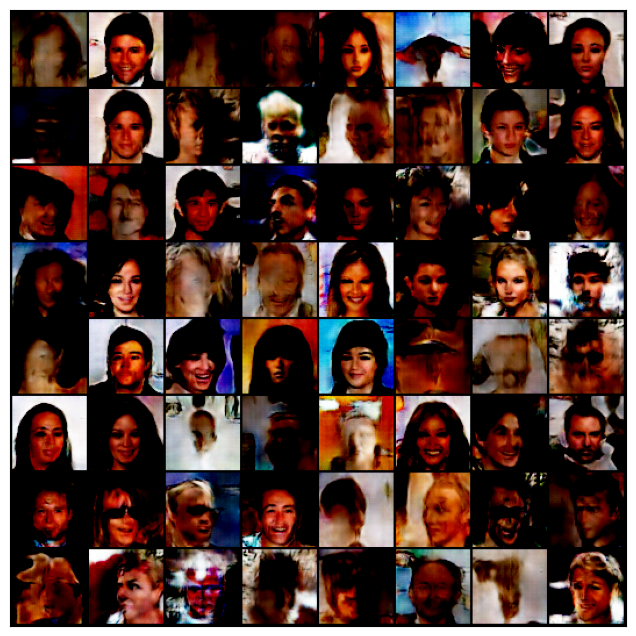

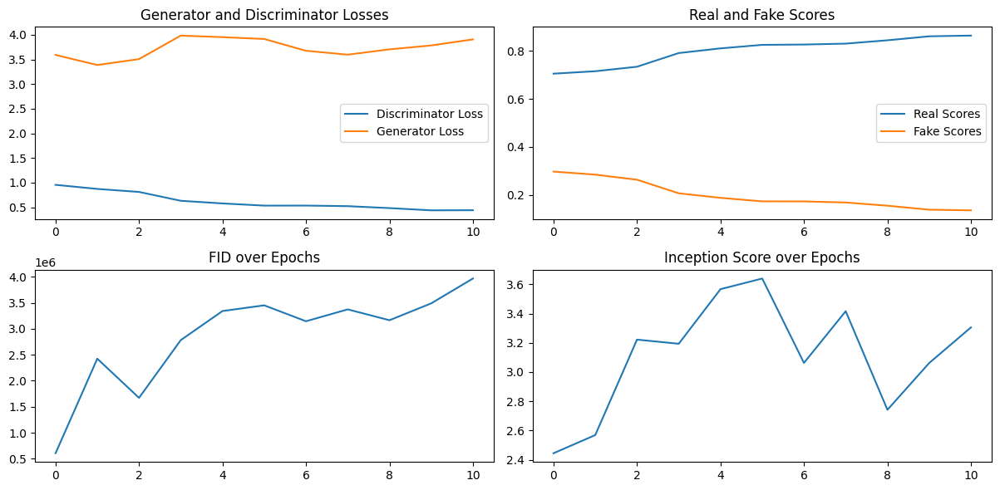

Epoch 12


100%|██████████| 1093/1093 [03:14<00:00,  5.61it/s]


d_loss: 0.4200
g_loss: 3.8937
real_scores: 0.8709
fake_scores: 0.1284


100%|██████████| 1/1 [00:00<00:00, 24.28it/s]


FID: (3707398-2.5868937969207764j), inseption_scores: 2.660317897796631


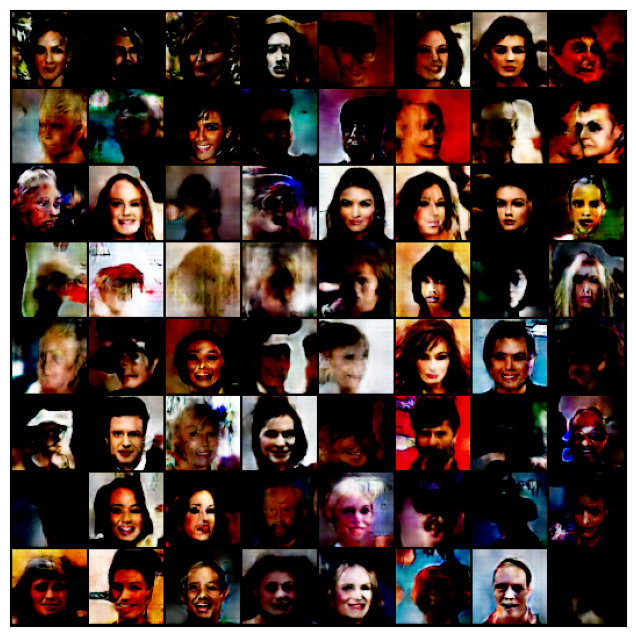

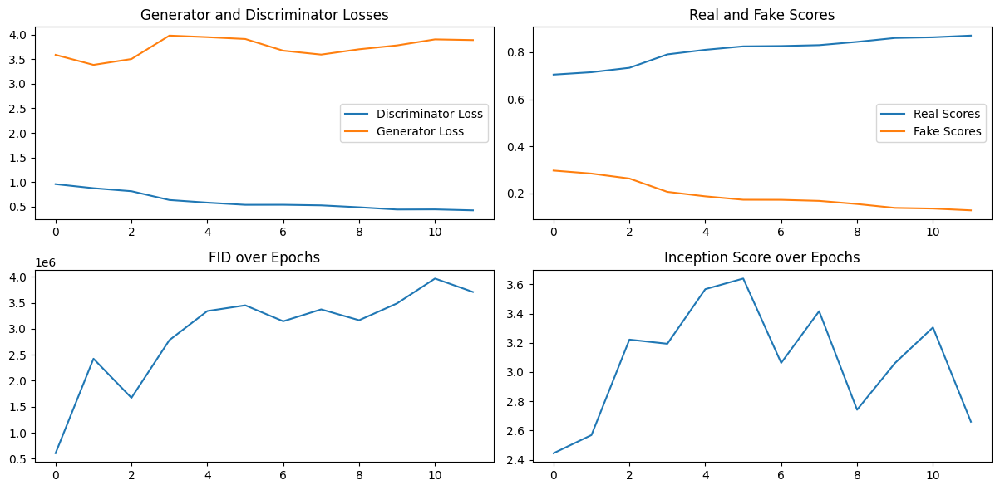

Epoch 13


100%|██████████| 1093/1093 [03:17<00:00,  5.52it/s]


d_loss: 0.3703
g_loss: 4.0928
real_scores: 0.8827
fake_scores: 0.1169


100%|██████████| 1/1 [00:00<00:00, 33.89it/s]


FID: (3191116-3.455836296081543j), inseption_scores: 2.9112462997436523


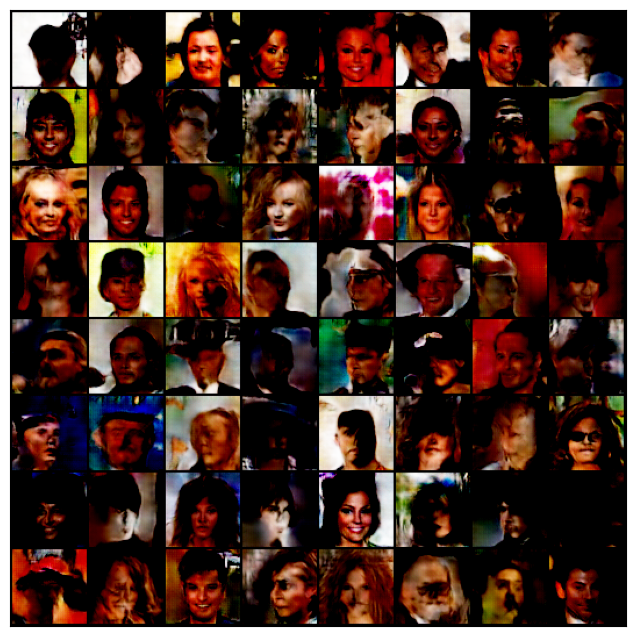

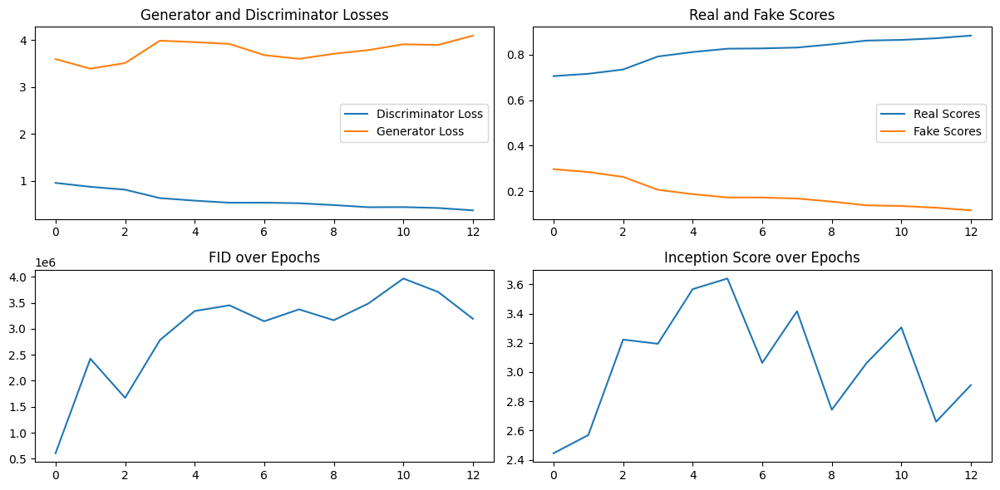

Epoch 14


100%|██████████| 1093/1093 [03:18<00:00,  5.51it/s]


d_loss: 0.3966
g_loss: 4.1433
real_scores: 0.8812
fake_scores: 0.1189


100%|██████████| 1/1 [00:00<00:00, 34.81it/s]


FID: (3674894.5-2.973771095275879j), inseption_scores: 2.955366611480713


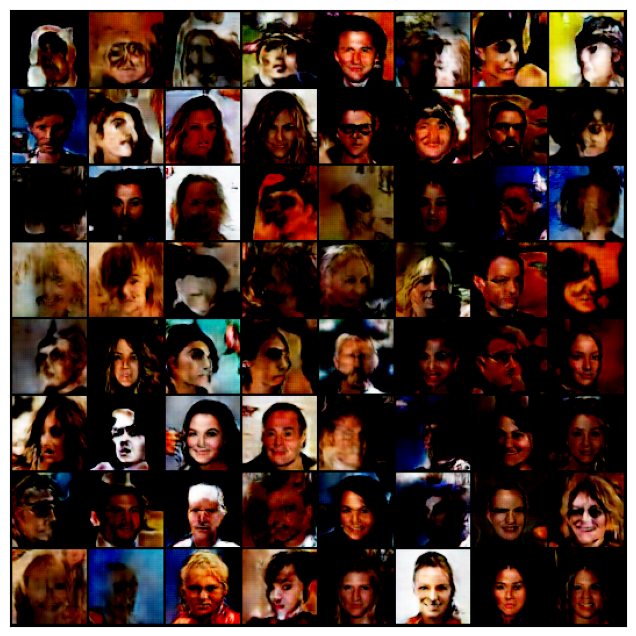

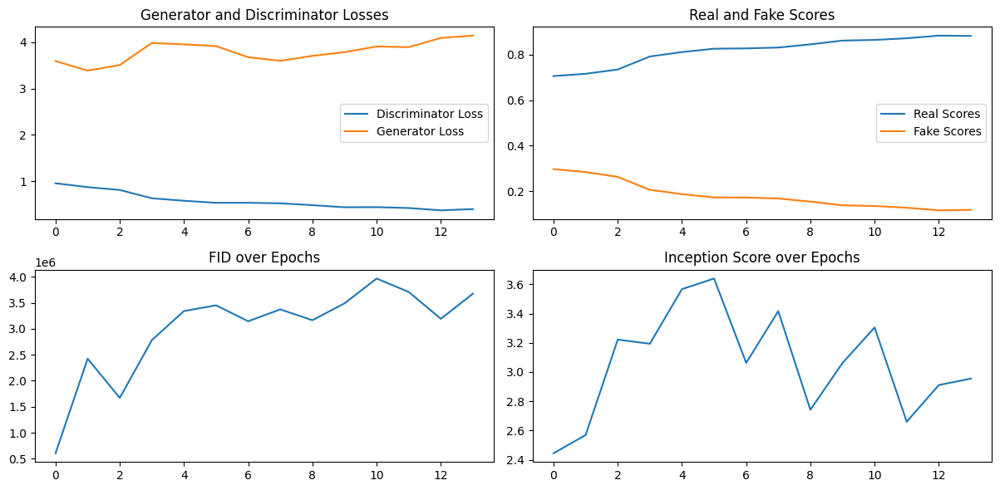

Epoch 15


100%|██████████| 1093/1093 [03:21<00:00,  5.41it/s]


d_loss: 0.3280
g_loss: 4.2302
real_scores: 0.8959
fake_scores: 0.1036


100%|██████████| 1/1 [00:00<00:00, 35.98it/s]


FID: (3274475.25-3.519761323928833j), inseption_scores: 3.02085542678833


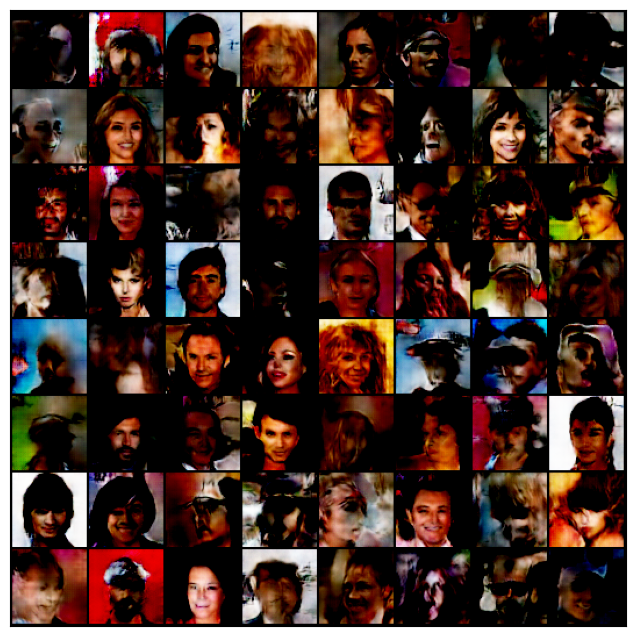

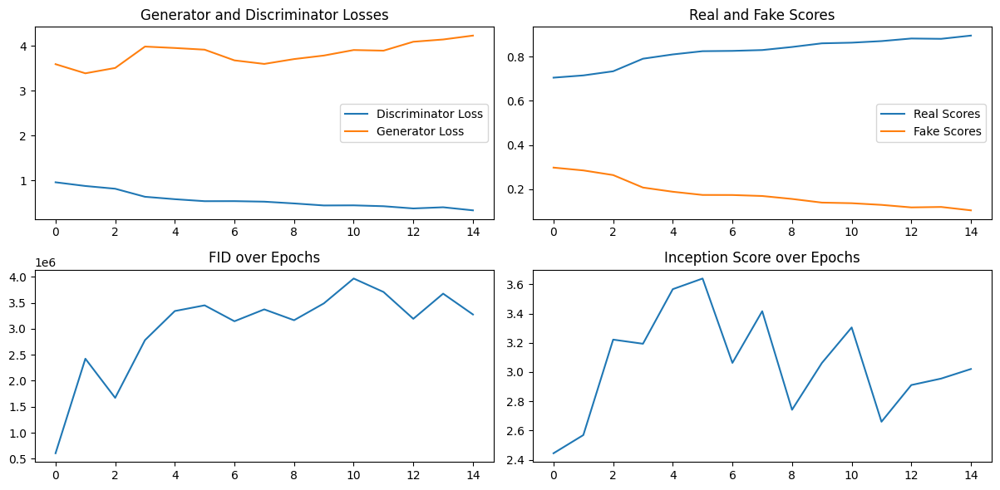

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
c_g = ConditionalGenerator(2, latent_size = 64).to(device)
c_d = ConditionalDiscriminator(2).to(device)

d_optimizer = torch.optim.Adam(c_d.parameters(), lr=0.0003, betas=(0.5, 0.999))
g_optimizer = torch.optim.Adam(c_g.parameters(), lr=0.0003, betas=(0.5, 0.999))

history = train_conditional_loop(c_d, c_g, d_optimizer, g_optimizer, train_loader, 15)